## Insurance Claim Fraud Detection

#### Project Description
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.


In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 


In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [2]:
df= pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [3]:
pd.set_option("display.max_columns", None)
df.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
df.shape

(1000, 40)

In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

fraud_reported is our target variable.

In [6]:
df.duplicated().sum()

0

No duplicate rows present

In [7]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

all null values are present in _c39, we can drop this column.

In [8]:
df=df.drop('_c39', axis=1) 
df.shape

(1000, 39)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [10]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


Observing mean, std, min, max and percentiles we can say that the data is skewed and outliers are present.

In [11]:
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
capital-gains                  0.478850
capital-loss                  -0.391472
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
dtype: float64

columns like umbrella_limit, insured_zip, total_claim_amount and vehicle_claim are more 

In [12]:
# number of unique values in each column
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

'policy_number' and 'incident_location' holds 1000 unique value which means these values are different for every row. we can delete this.

We can also observe few columns with huge number of unique values. let's study them more.

In [13]:
for i in df:
    if df[i].nunique()>900:
        print(i)
        print(df[i].value_counts())
        print()

policy_number
521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64

policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64

policy_annual_premium
1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89    1
766.19     1
Name: policy_annual_premium, Length: 991, dtype: int64

insured_zip
477695    2
469429    2
446895    2
431202    2
456602    2
         ..
476303    1
450339    1
476502    1
600561    1
612260    1
Name: insured_zip, Length: 995, dtype: int64

incident_location
9935 4th Drive         1
4214 MLK Ridge         1
8548 Cherokee Ridge    1
2352 MLK Drive         1
9734 2nd Ridge         1
       

we can delete 'insured_zip'.

In [14]:
df=df.drop(['policy_number','incident_location','insured_zip'], axis=1)
df.shape

(1000, 36)

In [15]:
#target variable
target= 'fraud_reported'

#### Sort continuous and categorical column names

In [16]:
con=df.select_dtypes(include= 'number').columns    #continous columns
con

Index(['months_as_customer', 'age', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'capital-gains',
       'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year'],
      dtype='object')

In [17]:
cat=df.select_dtypes(exclude= 'number').columns    #categorical columns
cat

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

#### More on Understanding columns

In [18]:
for i in cat:
    print(i)
    print(df[i].value_counts())
    print()

policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64

policy_state
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64

policy_csl
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64

insured_sex
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64

insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64

insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handle

Few of the columns contain '?' as a value.

Target variable is unbalanced with 'N' as majority class.

Female data is more in number.

Let's study more about columns with unknown values.

In [19]:
for i in df:
    if '?' in df[i].values:
        print(i)
        print(df[i].value_counts())
        print()

collision_type
Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

property_damage
?      360
NO     338
YES    302
Name: property_damage, dtype: int64

police_report_available
?      343
NO     343
YES    314
Name: police_report_available, dtype: int64



We can observe that '?' is in three of the columns. The count of these unknown values is huge. This can be treated as another category itself. we will not change this value.

In [20]:
df[target].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

Target variable seems unbalanced where 'N' value is the majority class.

In [21]:

for i in con:
    if df[i].nunique() <20:
        print("Column: ",i)
        print(df[i].unique())
        print()

Column:  policy_deductable
[1000 2000  500]

Column:  umbrella_limit
[       0  5000000  6000000  4000000  3000000  8000000  7000000  9000000
 10000000 -1000000  2000000]

Column:  number_of_vehicles_involved
[1 3 4 2]

Column:  bodily_injuries
[1 0 2]

Column:  witnesses
[2 0 3 1]



we can observe that many of the above columns are categories though they are int datatype.

In [22]:
new=['policy_deductable', 'umbrella_limit']

In [23]:
for i in new:
    df[i]=df[i].astype('object')

In [24]:
df.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable               object
policy_annual_premium          float64
umbrella_limit                  object
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries          

In [25]:
len(con), len(cat)

(16, 20)

In [26]:
con=df.select_dtypes(include= 'number').columns    #continous columns
con

Index(['months_as_customer', 'age', 'policy_annual_premium', 'capital-gains',
       'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year'],
      dtype='object')

In [27]:
cat=df.select_dtypes(exclude= 'number').columns    #categorical columns
cat

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'policy_deductable',
       'umbrella_limit', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [28]:
len(con), len(cat)

(14, 22)

#### Distribution plot and skewness of continous columns

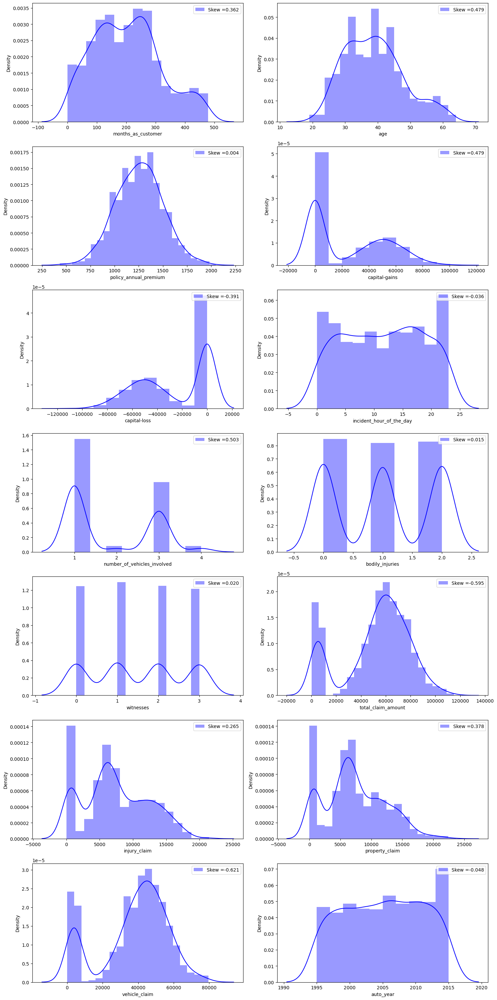

In [29]:
# Distribution plot and skewness
plt.figure(figsize=(15,30))
c=1
for i in con:
    plt.subplot(7,2,c)
    skew= df[i].skew()
    sns.distplot(df[i], color='blue', label= 'Skew =%.3f' %skew)
    plt.legend(loc='upper right')
    c+=1
    
plt.tight_layout()

Data is skewed.

### Visualisation

In [30]:
df.columns

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

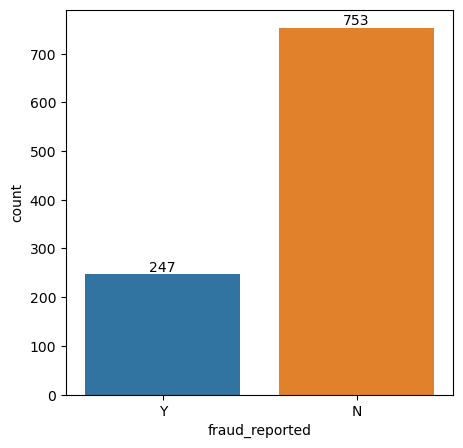

In [31]:
# target variable
plt.figure(figsize=(5,5))
ax= sns.countplot(x=df[target], data=df)
plt.bar_label(ax.containers[0])
plt.show()

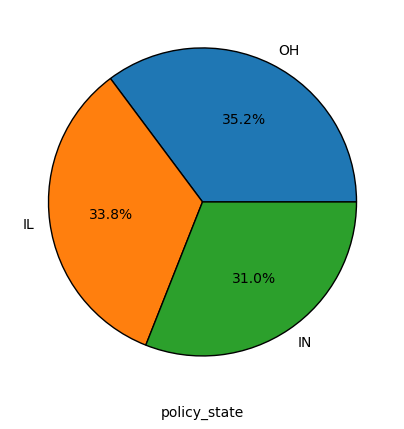

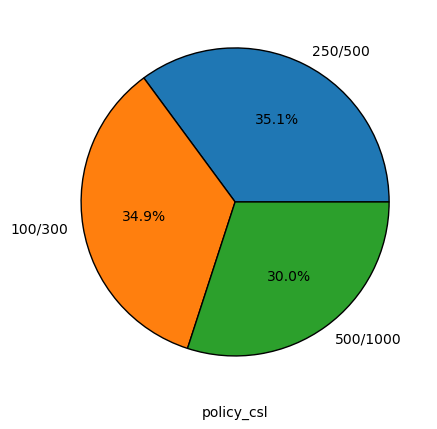

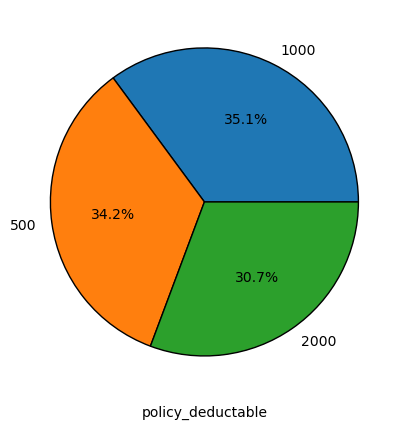

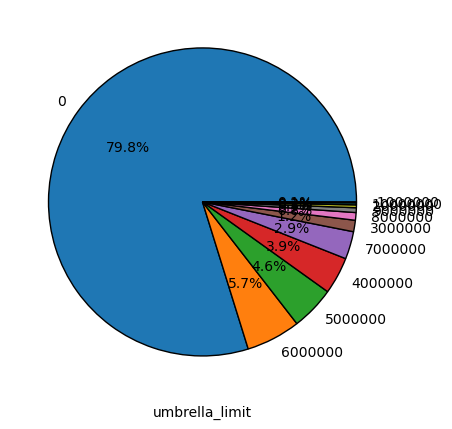

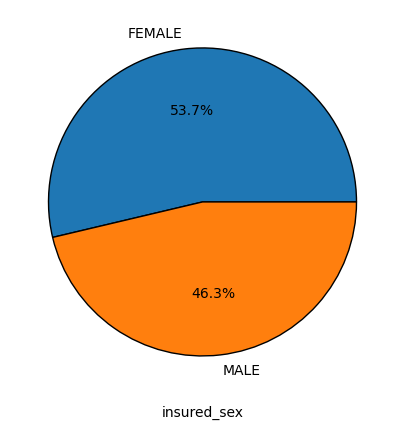

...

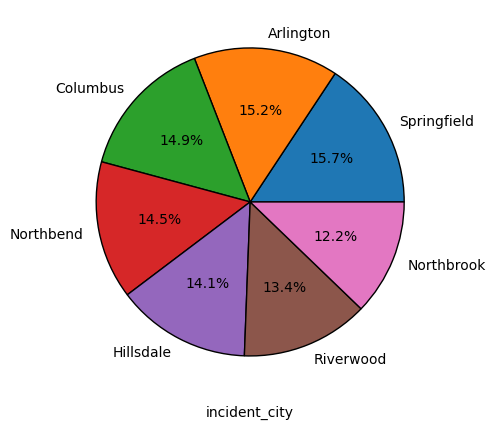

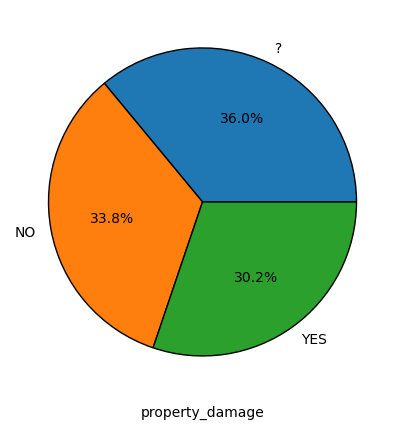

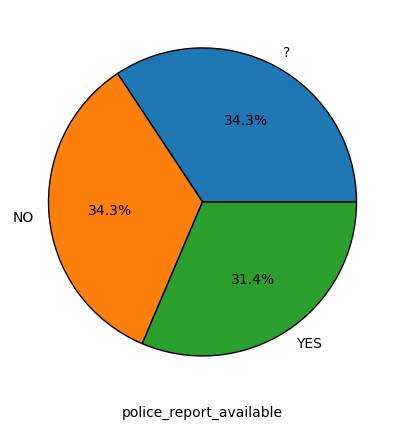

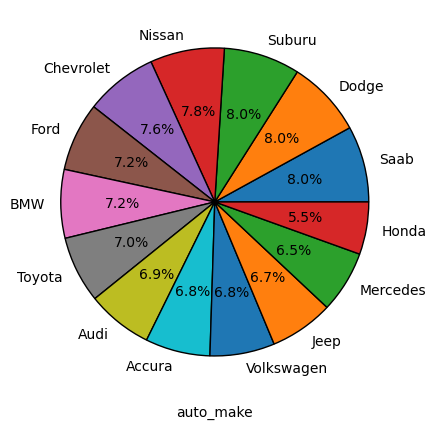

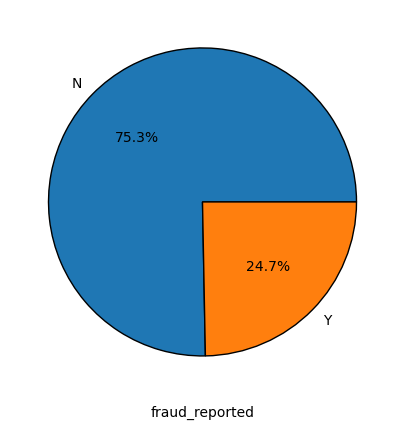

In [32]:
for i in cat:
    if df[i].nunique()<20:
        plt.figure(figsize=(5,5))
        df[i].value_counts().plot.pie(autopct='%1.1f%%', wedgeprops = {"edgecolor" : "Black",'linewidth':1})
        plt.xlabel(i)
        plt.ylabel("")

policy_state ---> class'OH' is in majority with 35.2%.


Umbrella_limit ---> class'0' is in huge majority with 79.8%.


insured_sex ---> Female is in majority with 53.7%.


incident_type ---> Multi-vehicle collision and Single collisions are the top 2 incident types, respectively.


collision_type ---> Rear Collision is in majority with 29.2%. '?' accounts for 17.8%.


number_of_vehicles_involved ---> 58.1% of the time only 1 vehicle is involved where as 35.8% of the time 3 vehicles are involved.


police_report_available ---> 31.4% of the people have police report where as 34.3% is unknown.

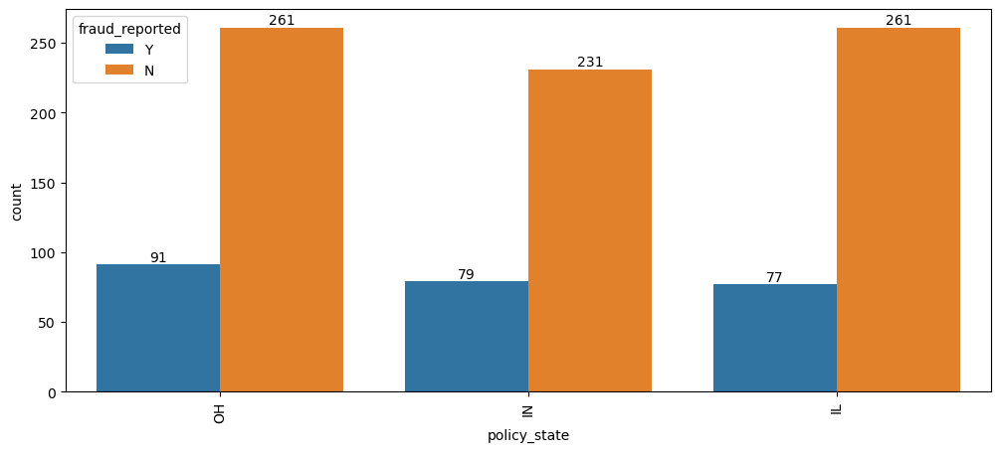

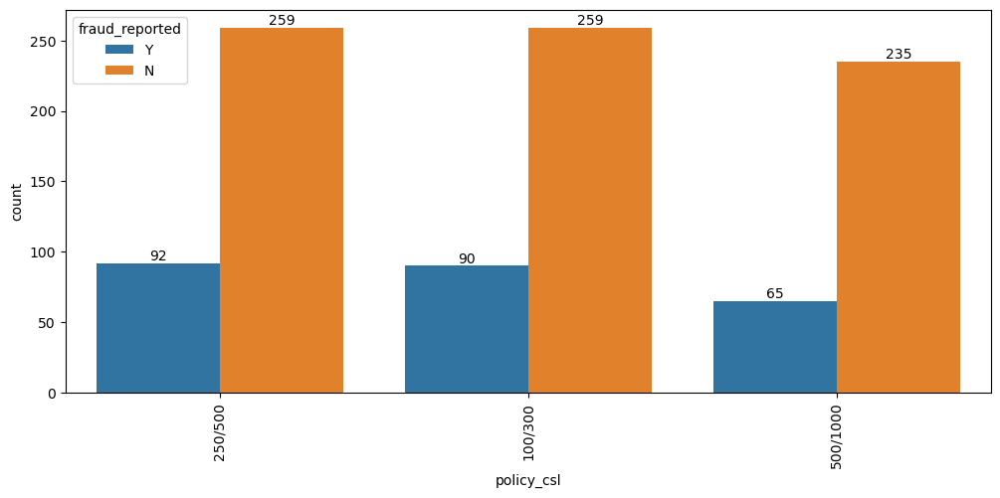

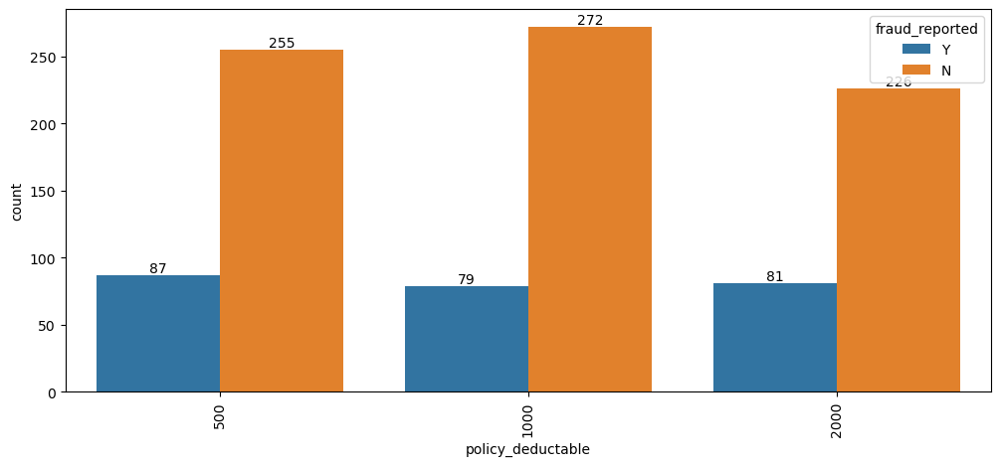

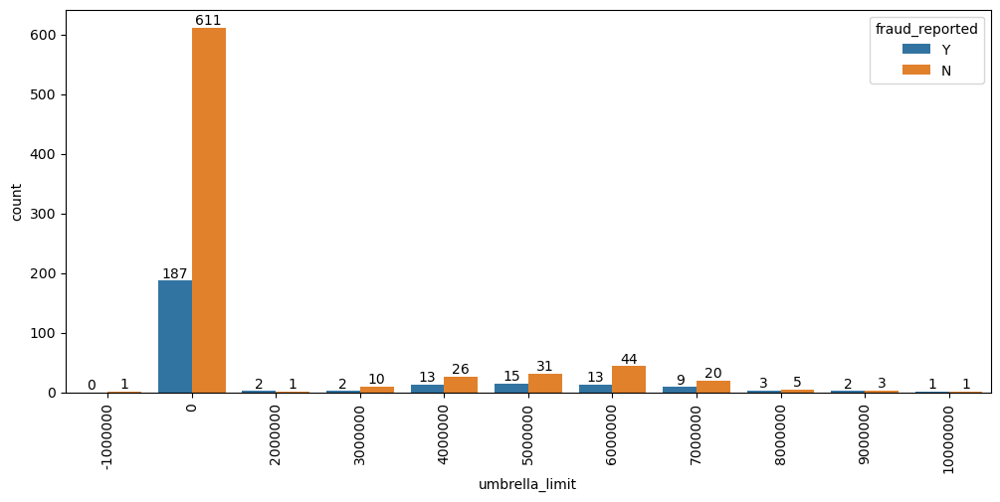

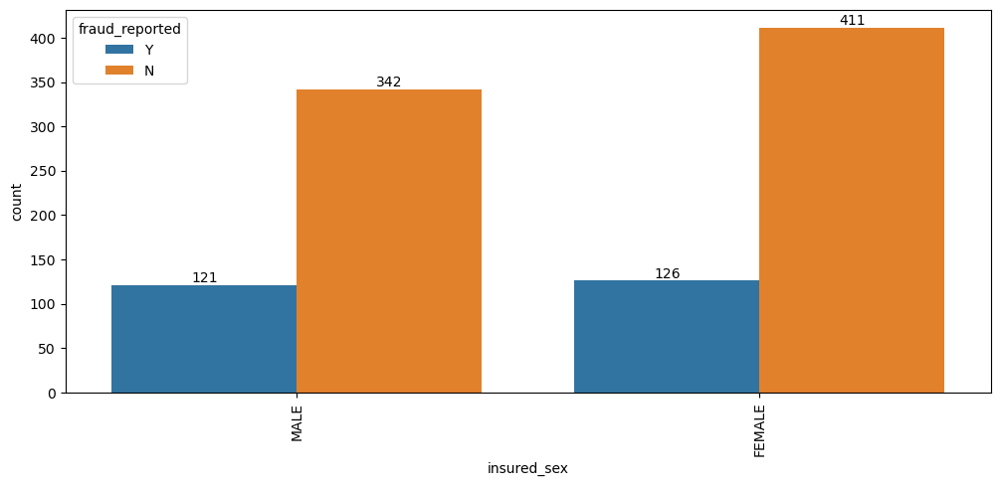

...

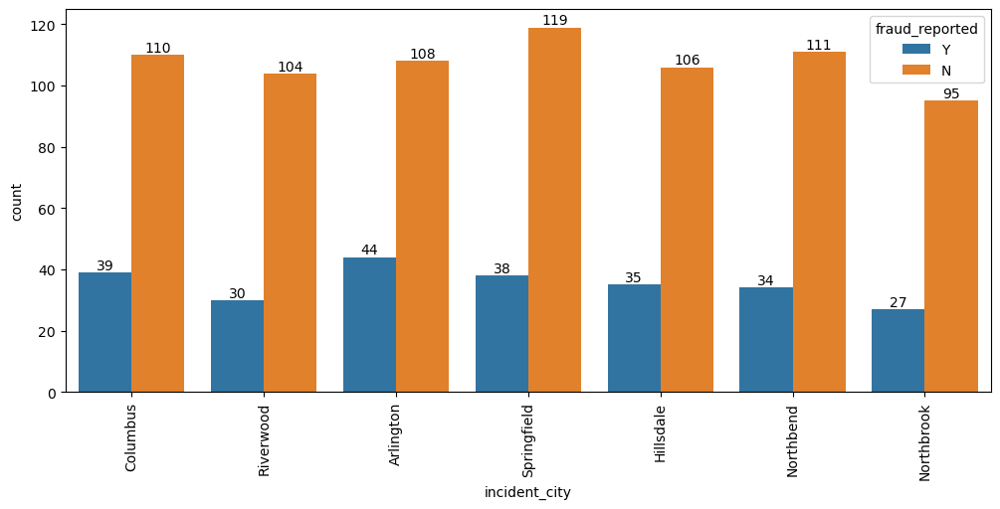

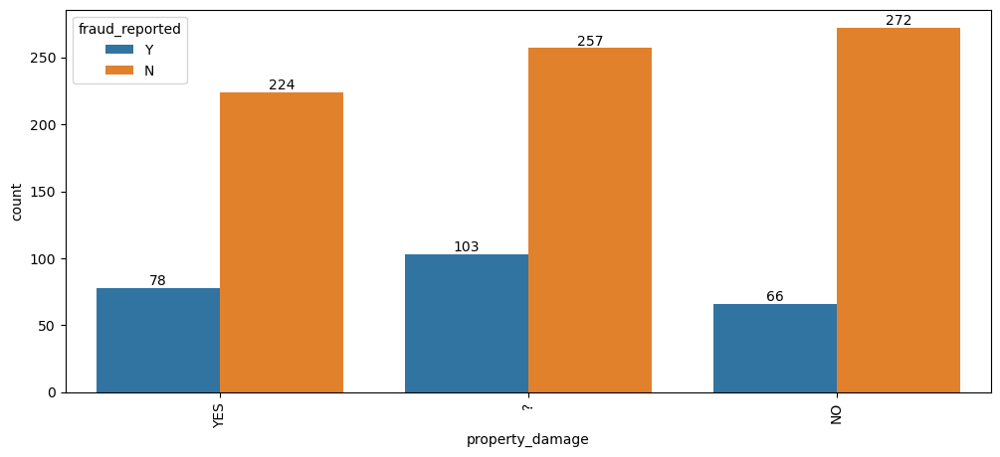

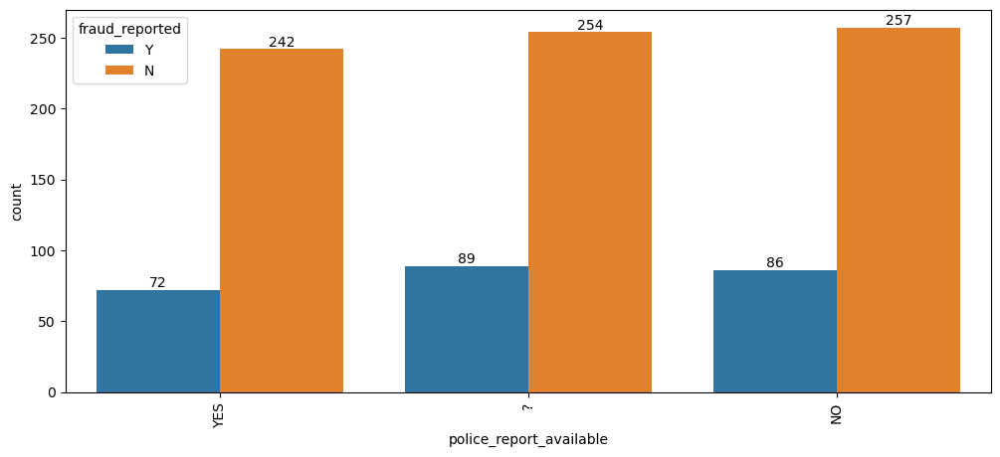

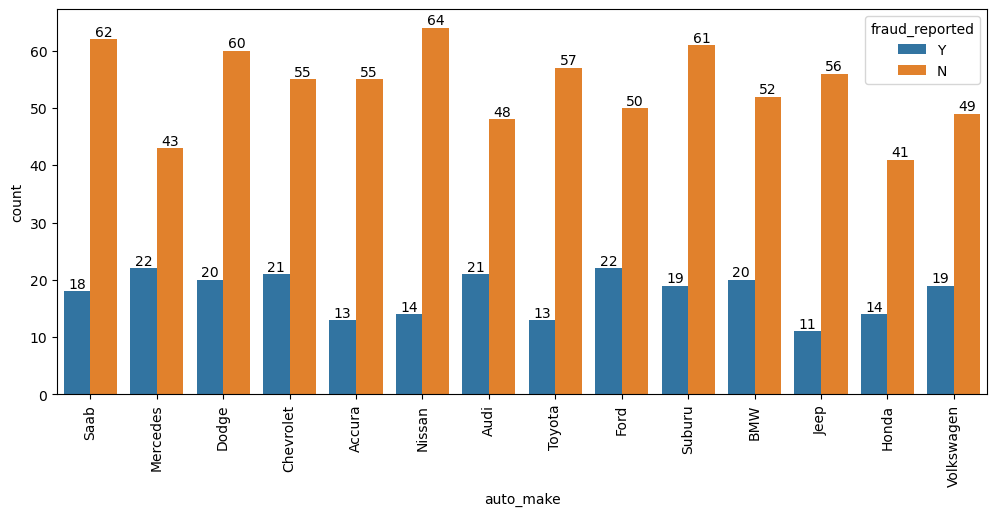

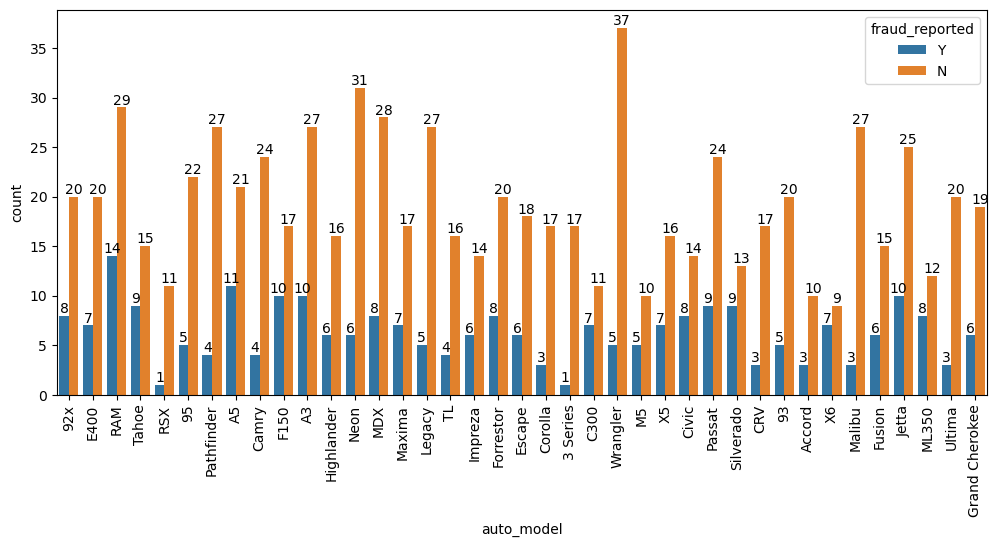

In [33]:
#categorical columns w.r.t target
for i in cat[1:-1]:
    plt.figure(figsize=(12,5))

    ax= sns.countplot(x=df[i], hue=df[target])
    plt.bar_label(ax.containers[0])
    plt.bar_label(ax.containers[1])
    
    plt.xticks(rotation=90)

insured_hobbies ----> Persons with hobby as playing chess are more in count as reported fraud.


Umbrella_limit----> class'0' is in huge majority which can be seen from the graph. This can make our model baised. We will delete this column.


Also, Policy_bind_date, Incident_date and auto_model also don't have any specific use. these columns can also be deleted.

In [34]:
li=['umbrella_limit', 'policy_bind_date', 'auto_model', 'incident_date']

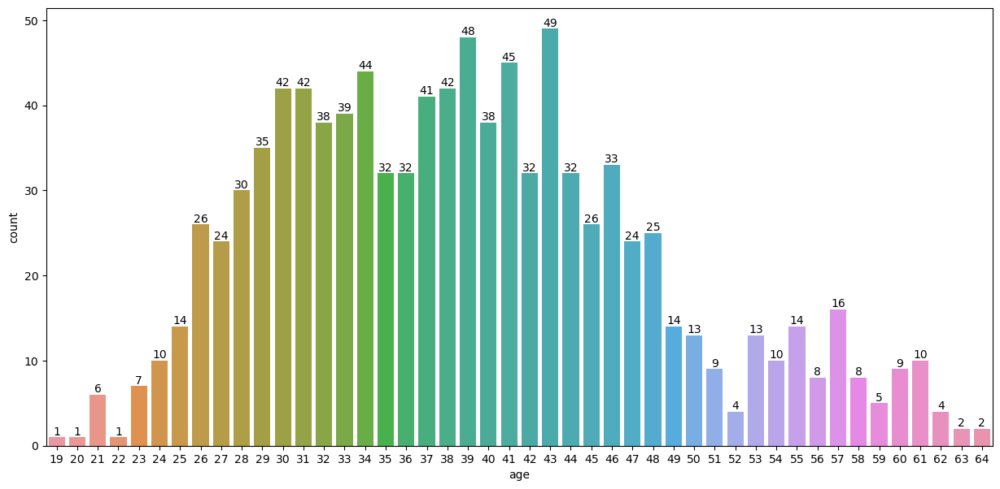

In [35]:
plt.figure(figsize=(15,7))
ax=sns.countplot(x=df['age'], data= df)
plt.bar_label(ax.containers[0])
plt.show()
#plt.xticks(rotation=90)

Age- 
Majority of the people belong to the age group of 25-50 years.

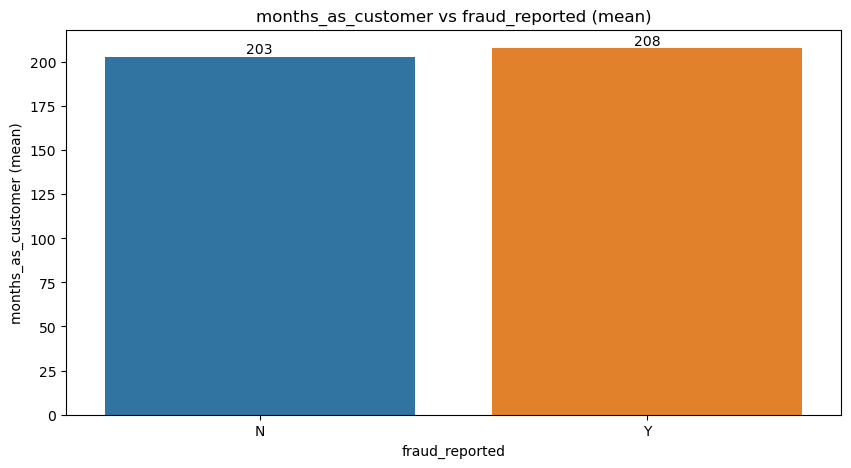

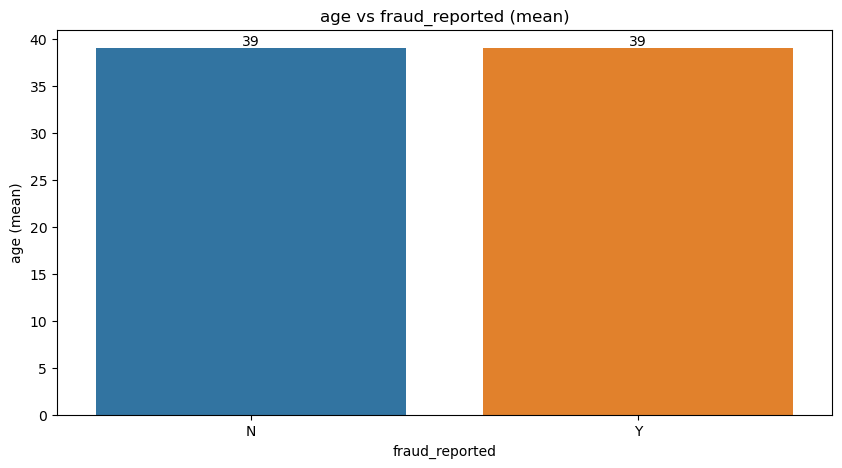

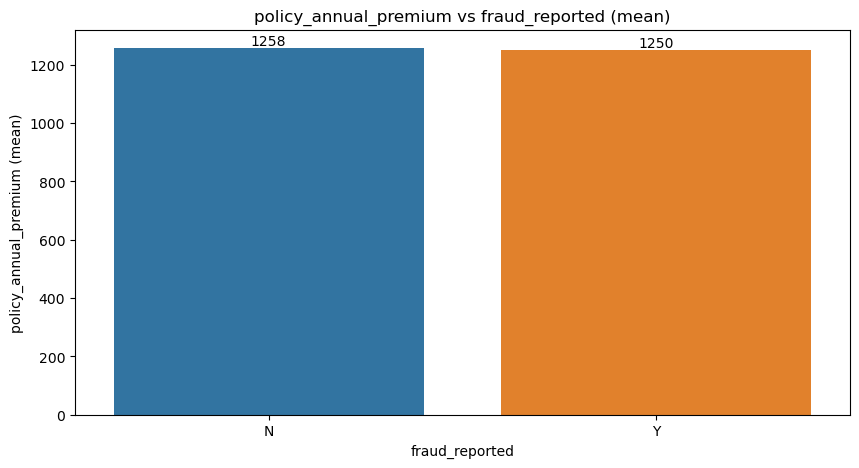

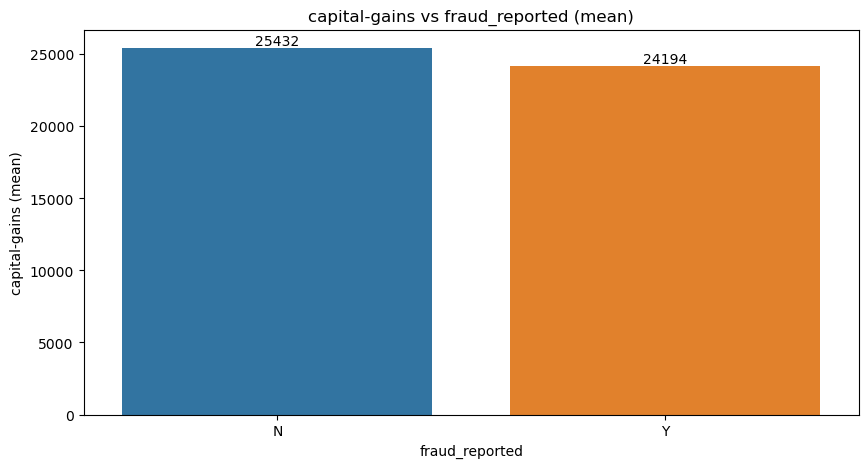

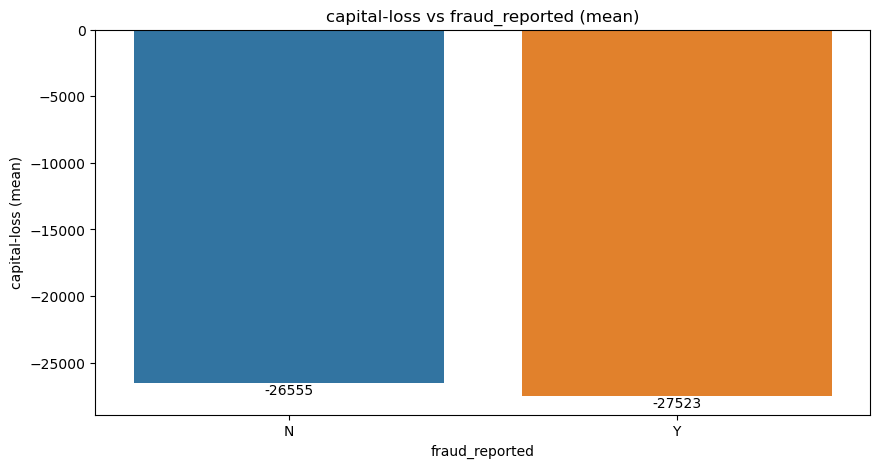

...

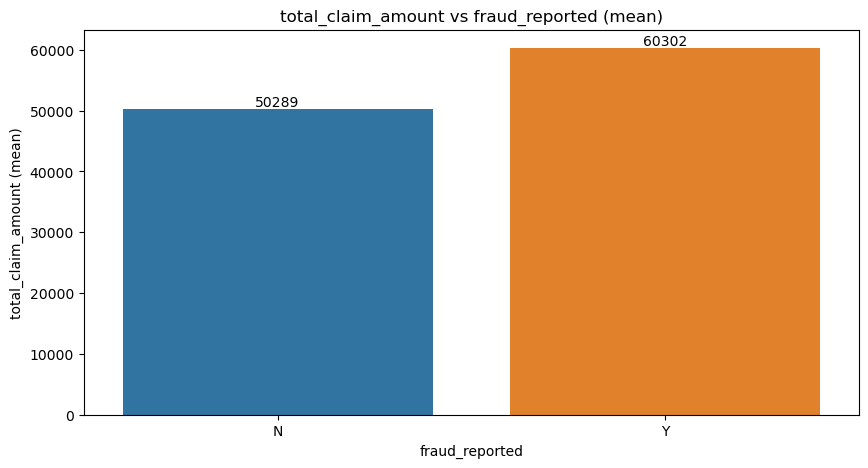

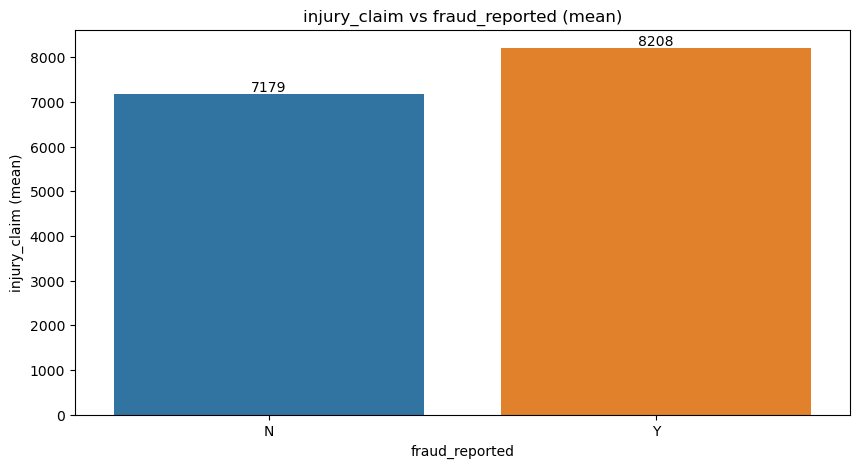

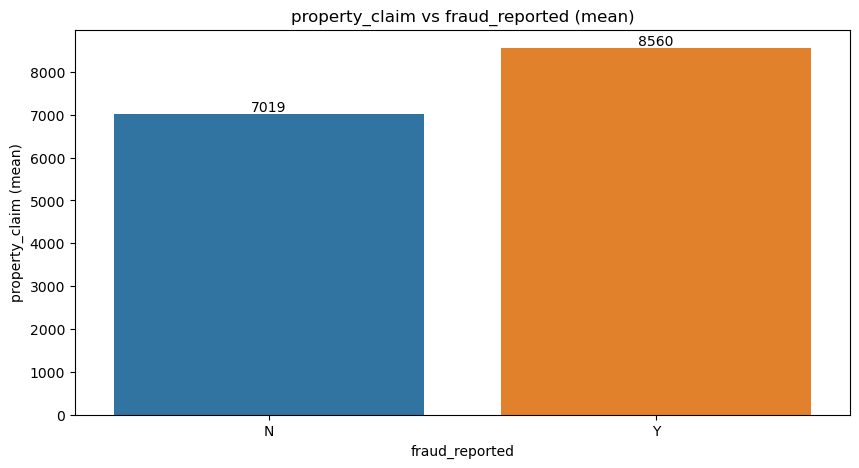

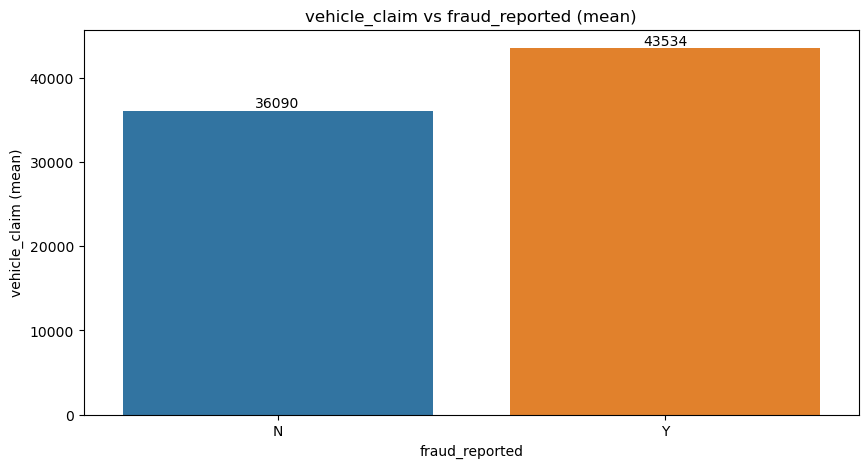

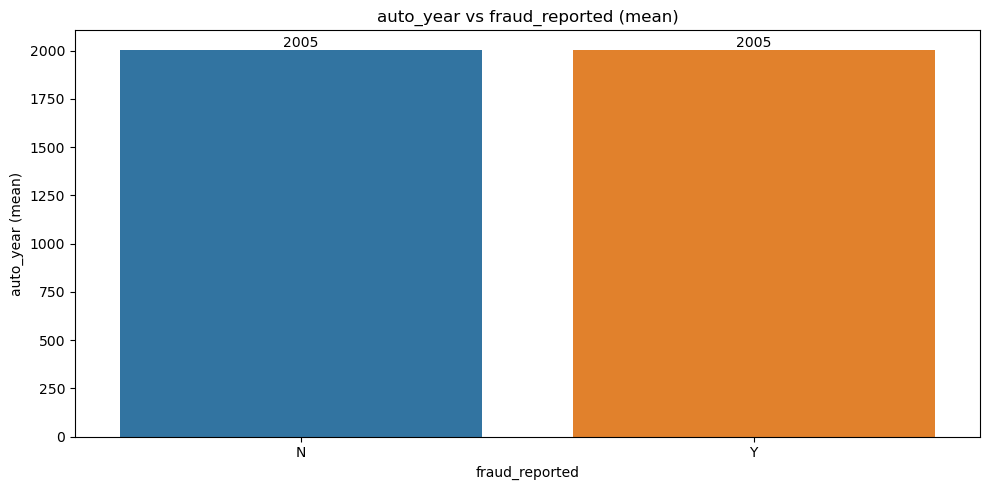

In [36]:
c=1
for i in con[:]:
    m=round(df.groupby(target)[i].mean(),0)
    n=round(df.groupby(target)[i].sum(),0)
    plt.figure(figsize=(10,5))
    
    ax=sns.barplot(x=m.index, y=m.values)
    plt.ylabel(i+' (mean)')
    plt.bar_label(ax.containers[0])
    plt.title(i+" vs "+target+ " (mean)")
    
plt.tight_layout()

incident hour of the day also can be deleted as it is not contributing much to the data.



In [37]:
li.append('incident_hour_of_the_day')
len(li)

5

In [38]:
df.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable               object
policy_annual_premium          float64
umbrella_limit                  object
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries          

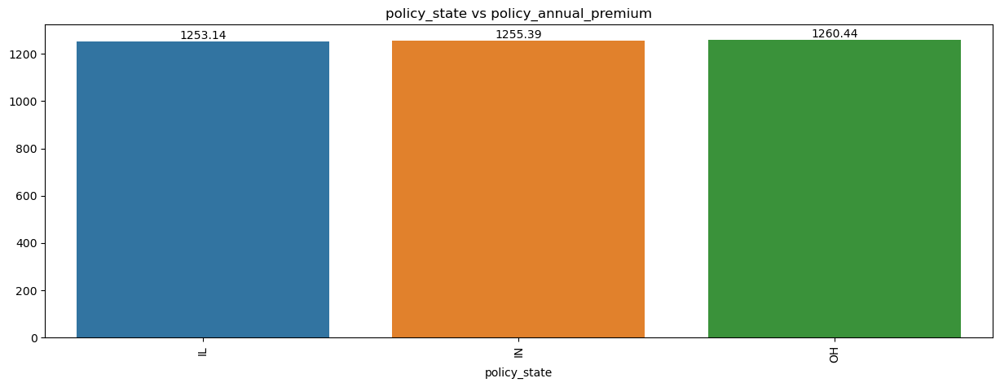

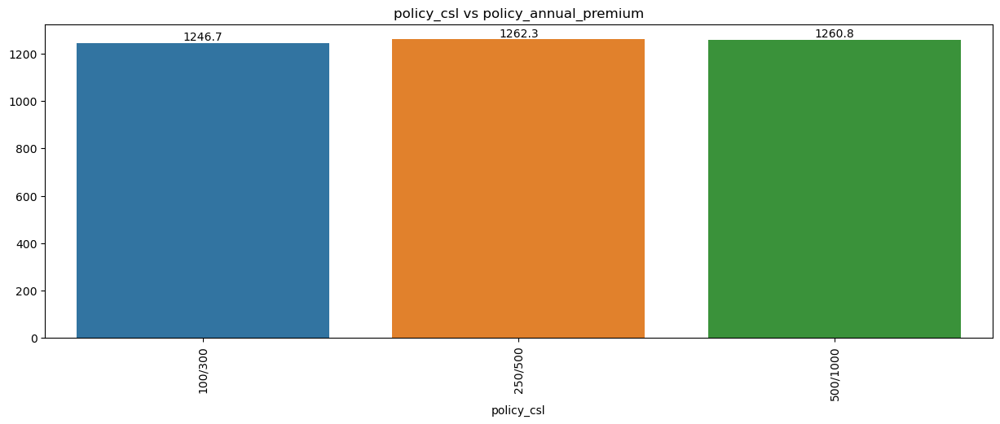

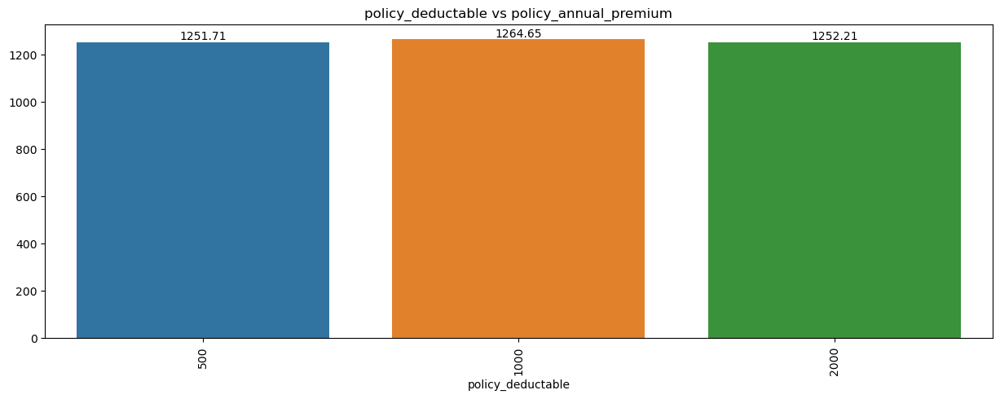

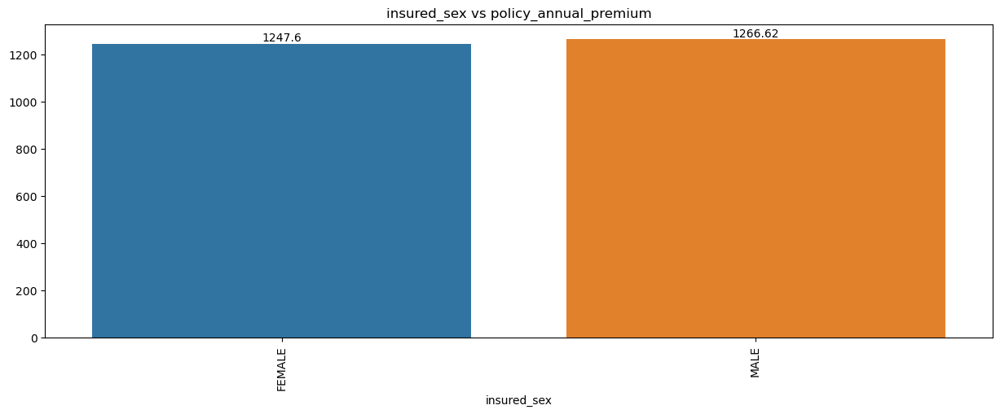

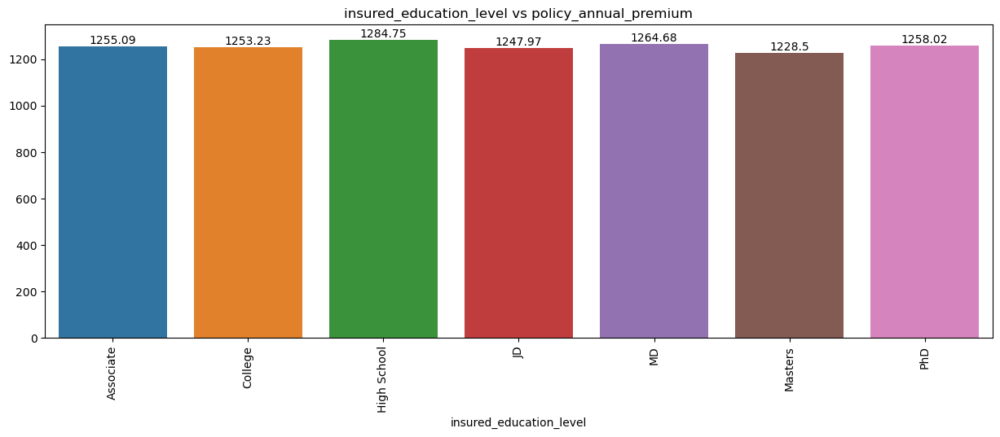

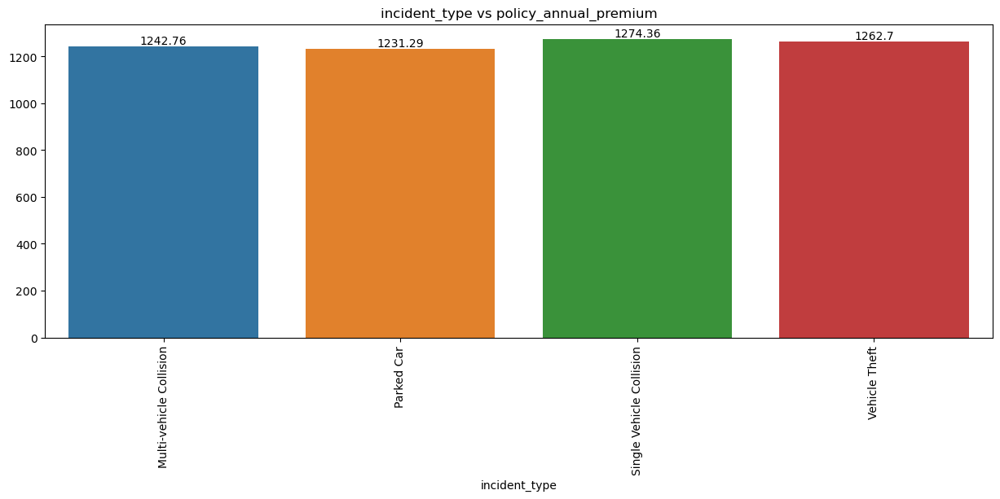

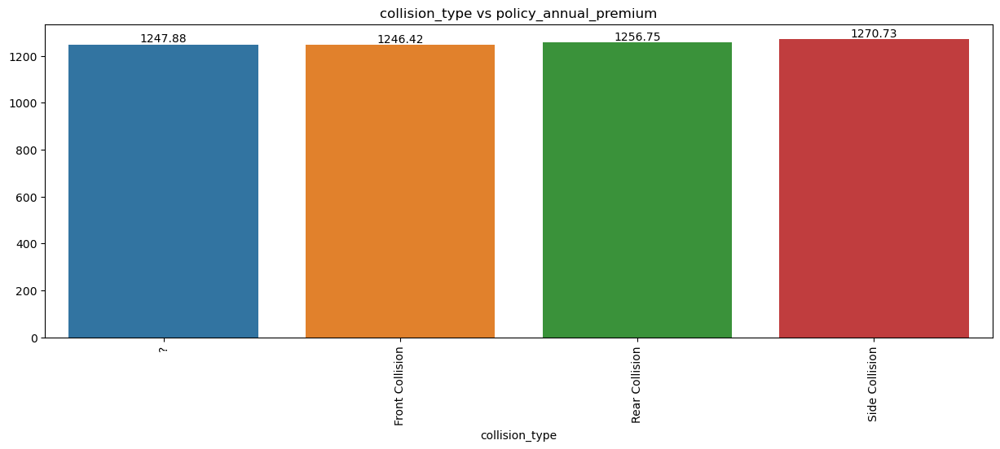

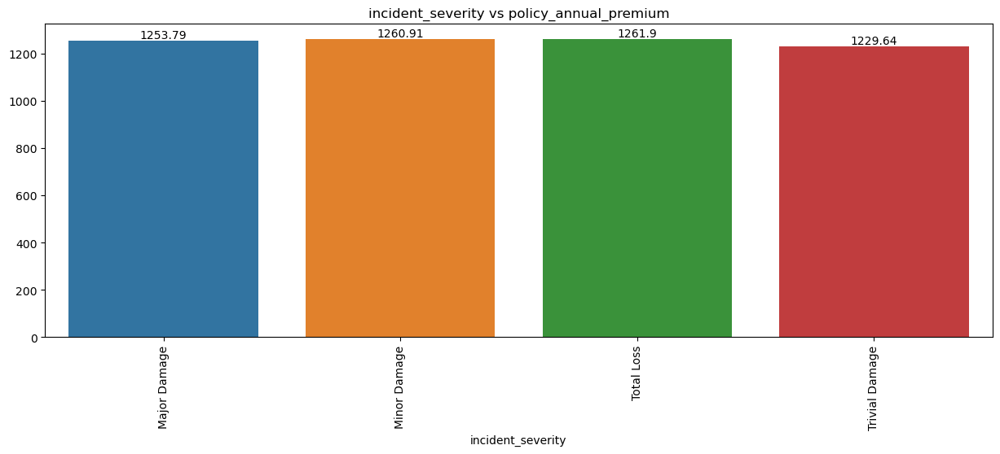

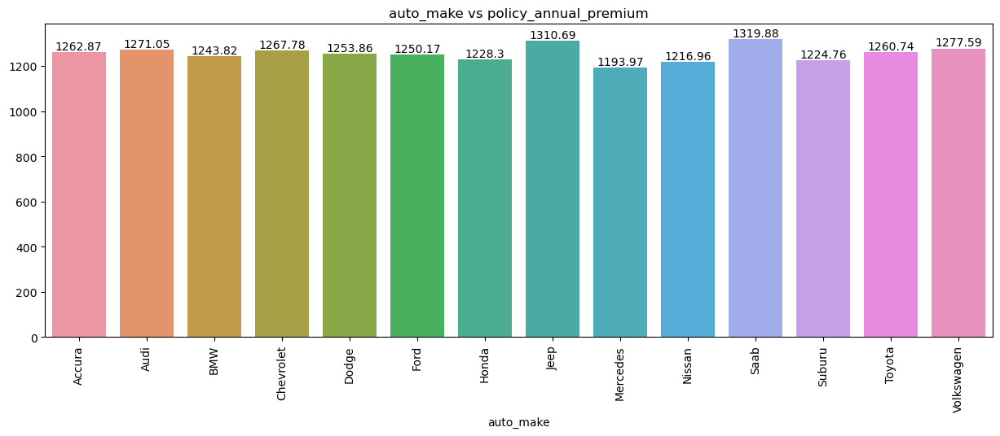

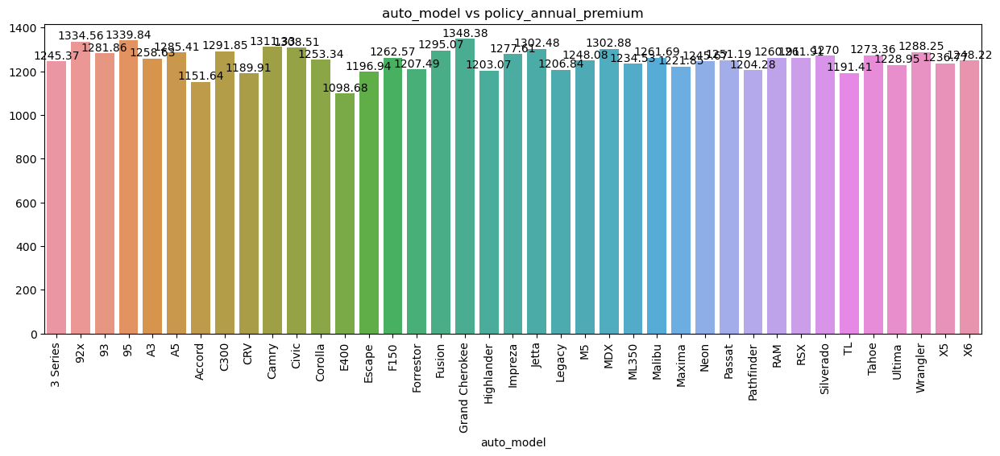

In [39]:
col=['policy_state', 'policy_csl', 'policy_deductable', 'insured_sex', 'insured_education_level', 'incident_type',
    'collision_type', 'incident_severity', 'auto_make', 'auto_model']

for i in col:
    m=df.groupby(i)['policy_annual_premium'].mean()

    plt.figure(figsize=(15,5))
    ax=sns.barplot(x=m.index, y=m.values)
    plt.bar_label(ax.containers[0])
    plt.title(i+" vs policy_annual_premium")
    plt.xticks(rotation=90)
    plt.show()

In [40]:
df.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable               object
policy_annual_premium          float64
umbrella_limit                  object
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries          

'Jeep' and 'Saab' auto_make have high policy premium.

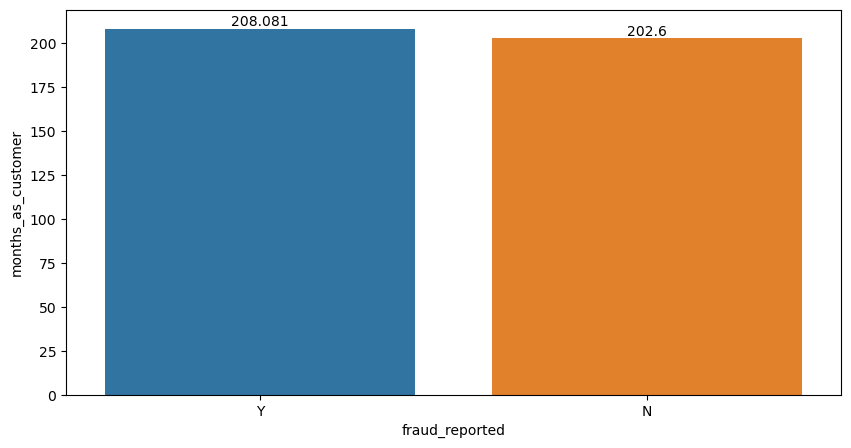

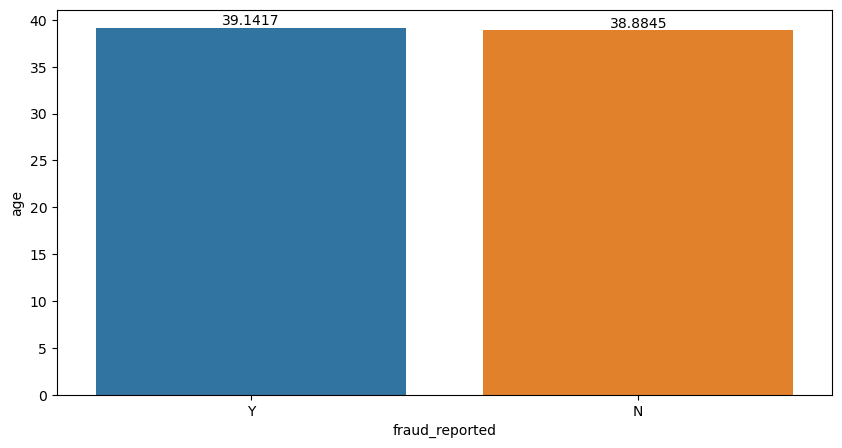

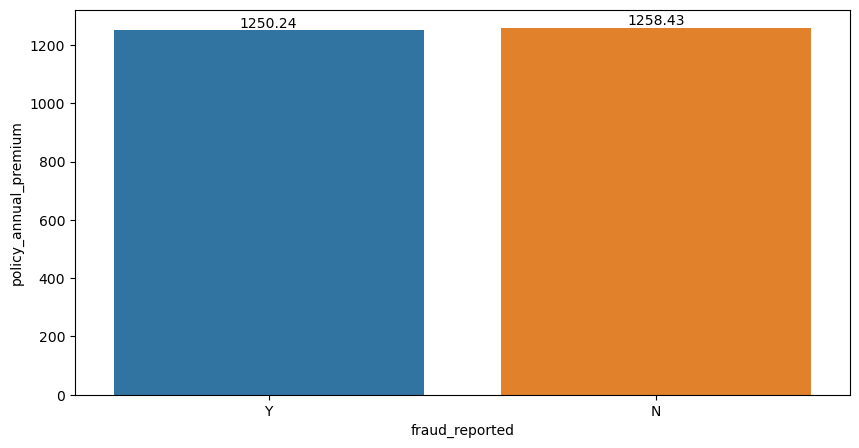

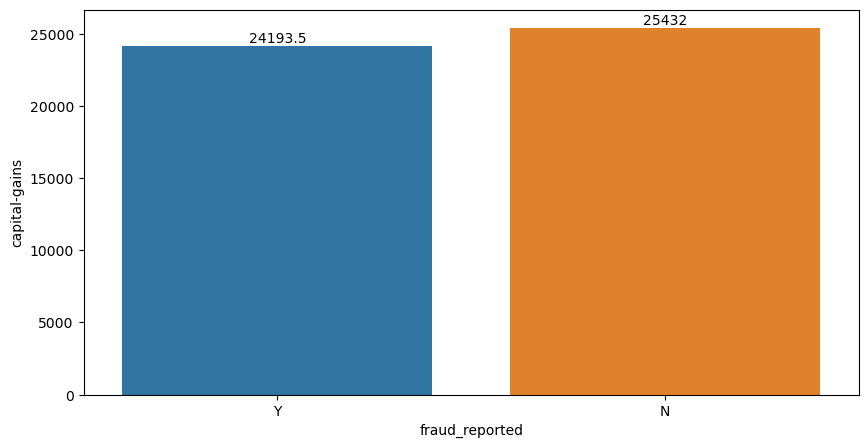

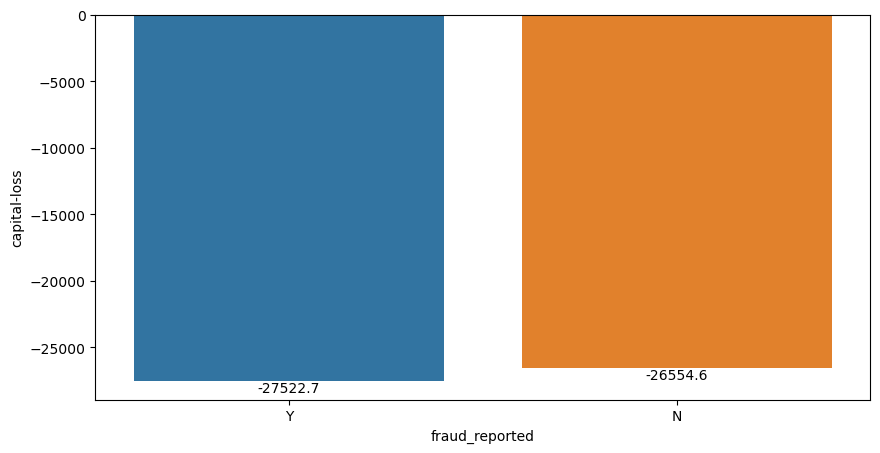

...

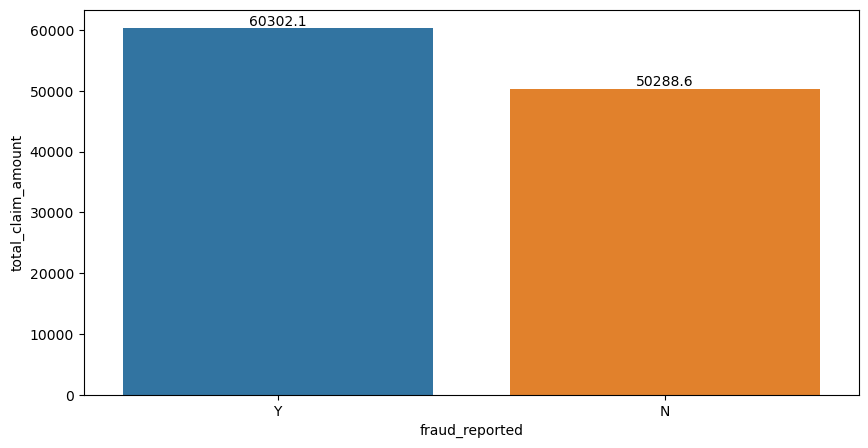

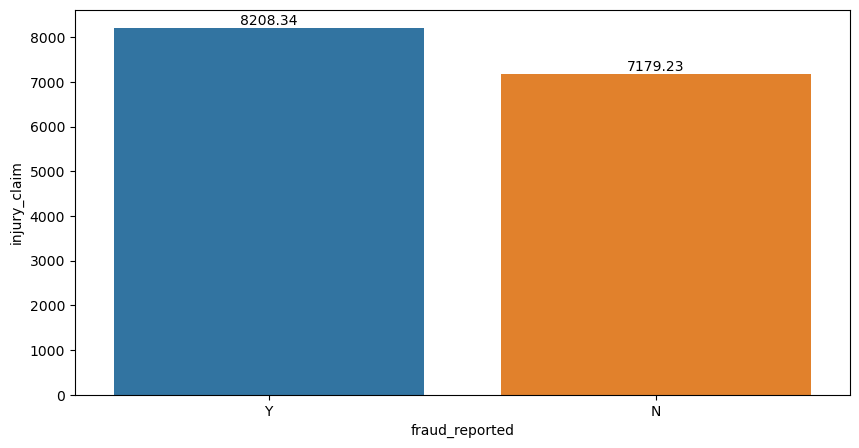

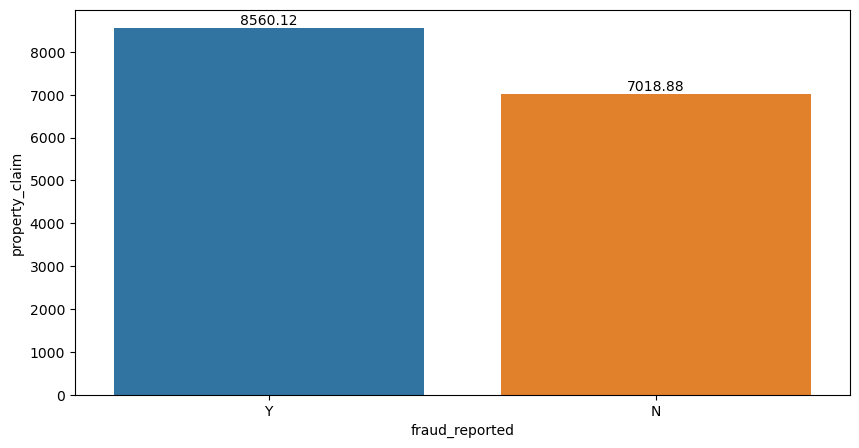

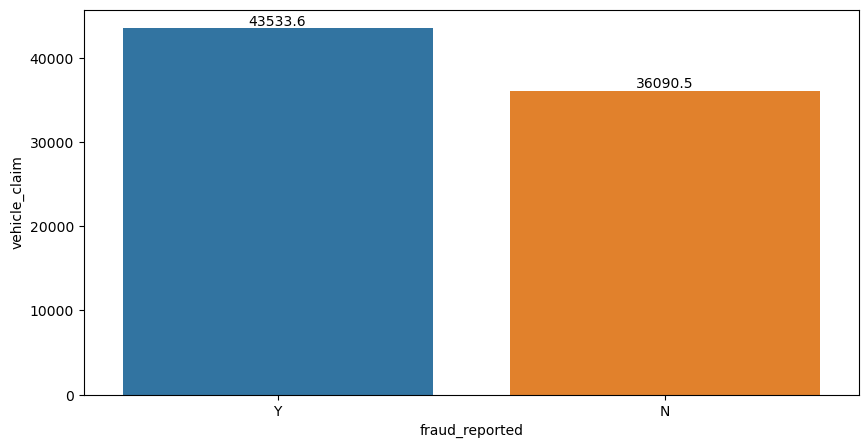

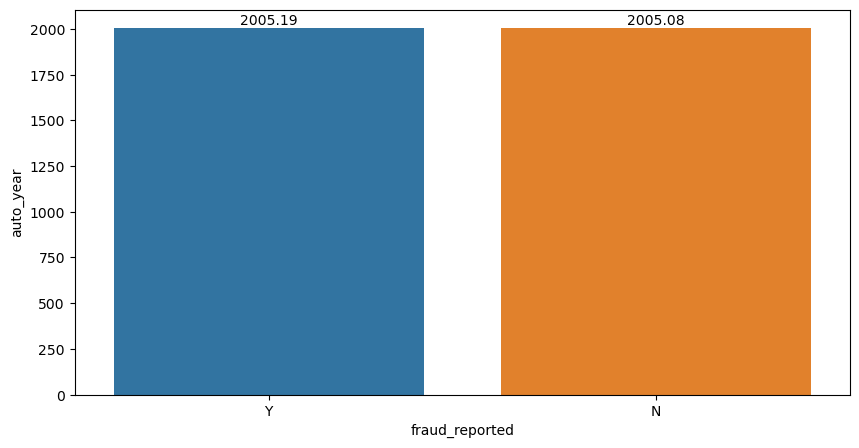

In [41]:
c=0
for i in con:
    plt.figure(figsize=(10,5))
    ax=sns.barplot(y=df[i],x=df[target], ci= False)
    plt.bar_label(ax.containers[0])
    #plt.title("Scatterplot (" +j+ " vs "+i+")")
    c+=1

In [42]:
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16-07-1991,OH,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,05-01-2014,IL,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,17-02-2003,OH,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,18-11-2011,IL,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [43]:
df=df.drop(li, axis=1)
df.shape

(1000, 31)

In [44]:
con=df.select_dtypes(include= 'number').columns
cat=df.select_dtypes(exclude= 'number').columns
con

Index(['months_as_customer', 'age', 'policy_annual_premium', 'capital-gains',
       'capital-loss', 'number_of_vehicles_involved', 'bodily_injuries',
       'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim',
       'vehicle_claim', 'auto_year'],
      dtype='object')

In [45]:
cat

Index(['policy_state', 'policy_csl', 'policy_deductable', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'property_damage', 'police_report_available',
       'auto_make', 'fraud_reported'],
      dtype='object')

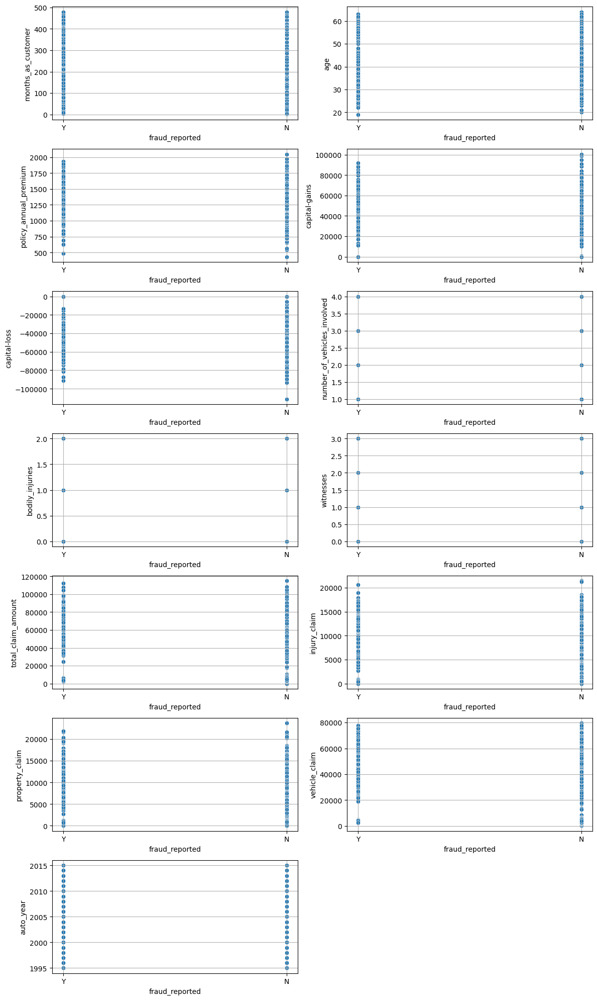

In [46]:
plt.figure(figsize=(12,20))
c=1
for i in con[:]:
    plt.subplot(7,2,c)
    ax=sns.scatterplot(y=df[i],x=df[target])
    c+=1
    plt.grid()
plt.tight_layout()

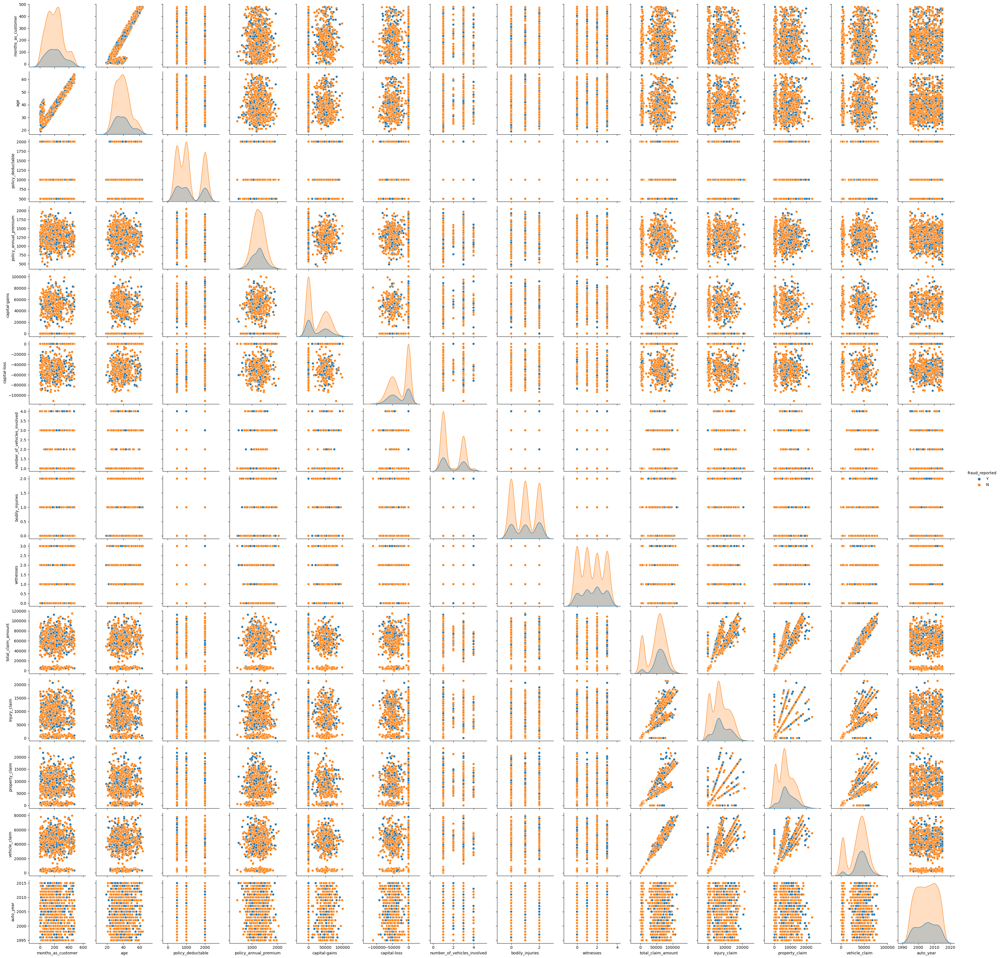

In [47]:
sns.pairplot(df, hue = target)

### Boxplot and outliers

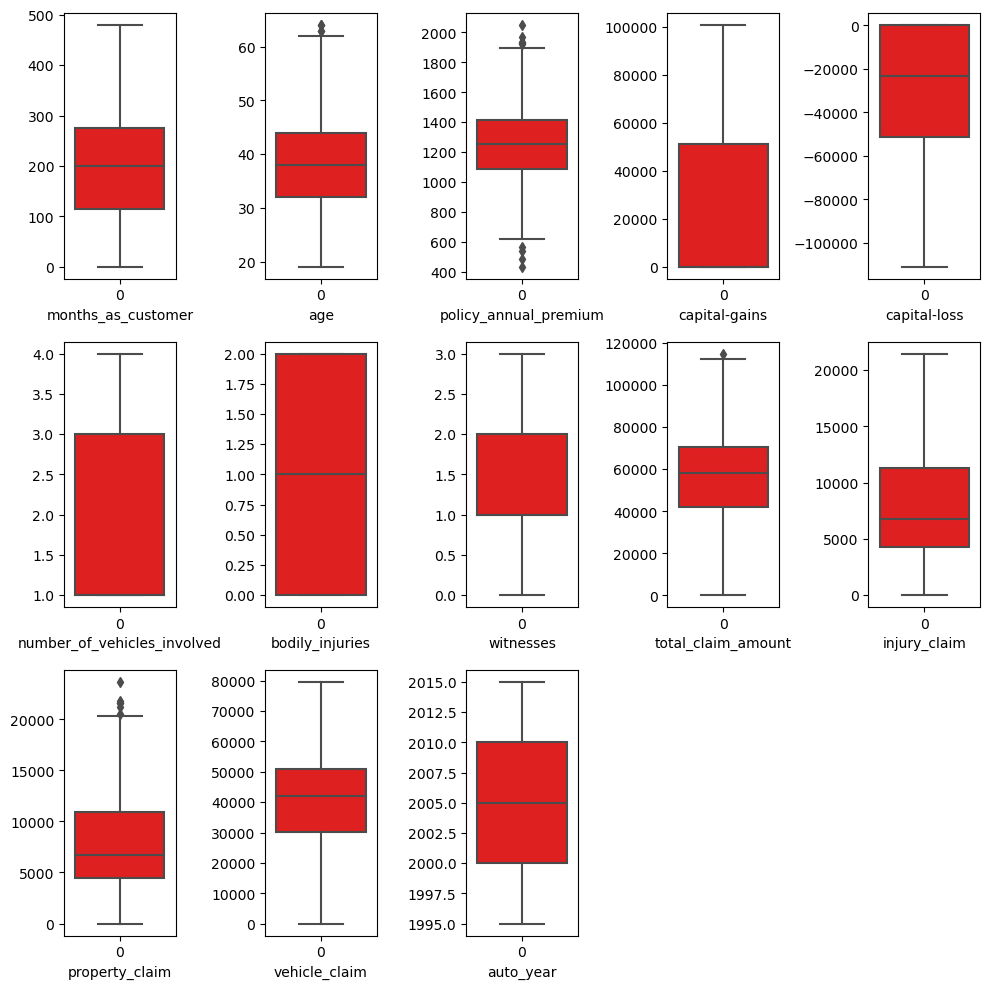

In [48]:
# Boxplot
plt.figure(figsize=(10,10))
c=1 
for i in con:
    plt.subplot(3,5,c)
    sns.boxplot(df[i], orient='v', color= 'red')
    plt.xlabel(i)
    c+=1
    
plt.tight_layout()

There are outliers in the dataset.

In [49]:
# index of outliers by iqr
ind=[]
for i in con:
    IQR= df[i].quantile(0.75) - df[i].quantile(0.25)
    upper= df[i].quantile(0.75) + (IQR * 1.5)
    lower= df[i].quantile(0.25) - (IQR * 1.5)
    
    ind.append(df[df[i]>upper].index)
    ind.append(df[df[i]<lower].index)
    
no=[j for i in range (len(ind)) for j in ind[i]]    #getting all elements from nested 'ind' list

# there are possibilities that several indexes are repeated in the list.
len(set(no))

20

In [50]:
#zscore
from scipy.stats import zscore

z = zscore(df[con])
t=np.abs(z)
# taking thresold value = 3

df2 = df[(t<3).all(axis = 1)]
df2.shape

(995, 31)

In [51]:
l=df.shape[0]-df2.shape[0]
l

5

In [52]:
#Percentage of data loss
print("By IQR, the percent of data loss is {0}".format(len(set(no))/df.shape[0]*100))
print()
print("By z-score, the percent of data loss is {0}".format(l/df.shape[0]*100))

By IQR, the percent of data loss is 2.0

By z-score, the percent of data loss is 0.5


Using z-score for outlier removal we can see that there are less outliers.

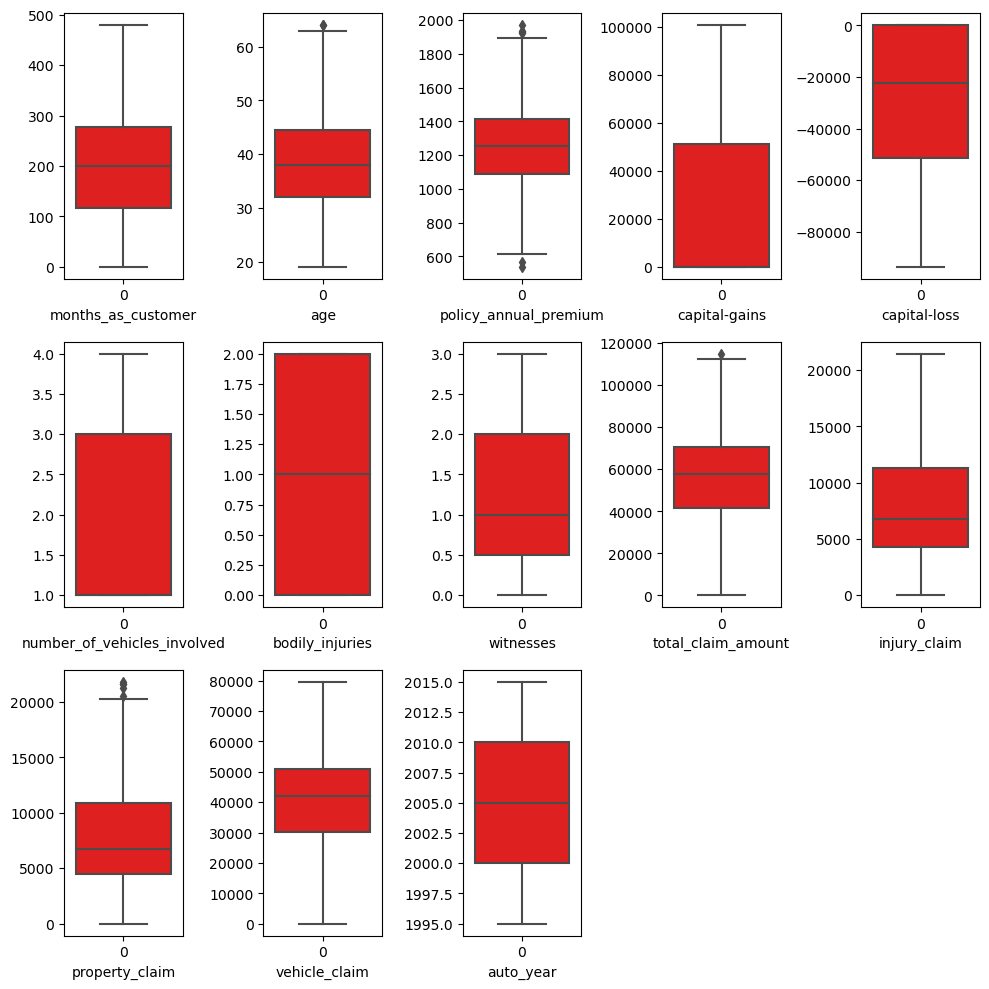

In [53]:
# Boxplot after z-score
plt.figure(figsize=(10,10))
c=1 
for i in con:
    plt.subplot(3,5,c)
    sns.boxplot(df2[i], orient='v', color= 'red')
    plt.xlabel(i)
    c+=1
    
plt.tight_layout()

In [54]:
df2.shape

(995, 31)

#### Skewness

In [55]:
df2.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_year', 'fraud_reported'],
      dtype='object')

In [56]:
df2.skew()

months_as_customer             0.358958
age                            0.473974
policy_deductable              0.475849
policy_annual_premium          0.033107
capital-gains                  0.479472
capital-loss                  -0.379708
number_of_vehicles_involved    0.503045
bodily_injuries                0.012979
witnesses                      0.027371
total_claim_amount            -0.591848
injury_claim                   0.270253
property_claim                 0.359528
vehicle_claim                 -0.618189
auto_year                     -0.049758
dtype: float64

from above we can see that only total_claim_amount and vehicle_claim are highly skewed. we need to perform transformation on them.

In [57]:
# PowerTransformation

from sklearn.preprocessing import PowerTransformer
pw = PowerTransformer()

In [58]:
x_pw = pw.fit_transform(df[['total_claim_amount', 'vehicle_claim']])
df3 = pd.DataFrame(x_pw, columns =['total_claim_amount', 'vehicle_claim'])

In [59]:
df3

,total_claim_amount,vehicle_claim
0,0.715714,0.753697
1,-1.776979,-1.786629
2,-0.716825,-0.820881
3,0.391426,0.677602
4,-1.729802,-1.740038
...,...,...
995,1.338829,1.259186
996,2.202447,1.904757
997,0.553012,0.777232
998,-0.247520,-0.104258


In [60]:
df3.skew()

total_claim_amount   -0.510354
vehicle_claim        -0.522718
dtype: float64

In [61]:
df2[['total_claim_amount', 'vehicle_claim']]=df3

In [62]:
df2[['total_claim_amount', 'vehicle_claim']].skew()

total_claim_amount   -0.507252
vehicle_claim        -0.519472
dtype: float64

skewness is reduced.

In [63]:
len(con)

13

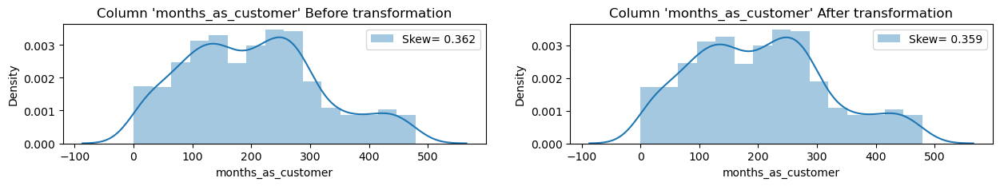

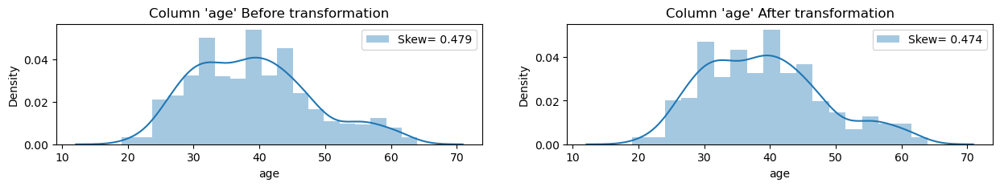

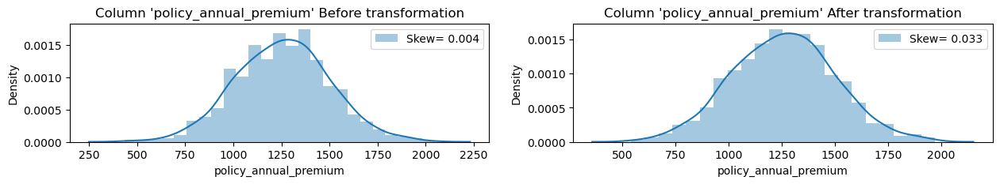

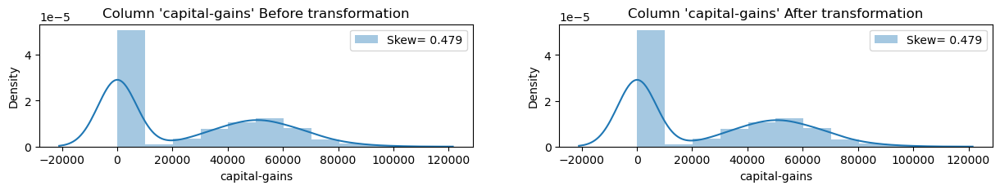

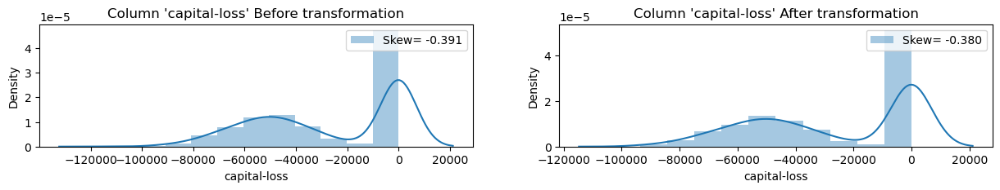

...

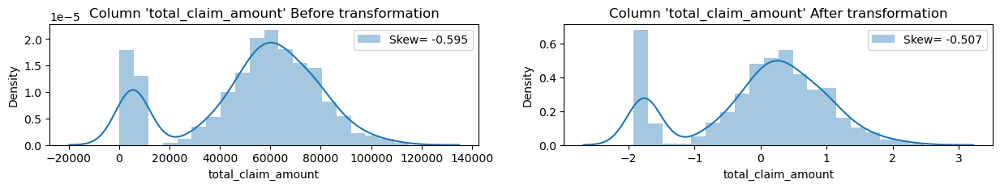

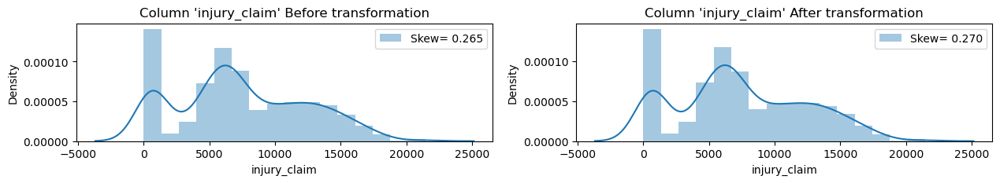

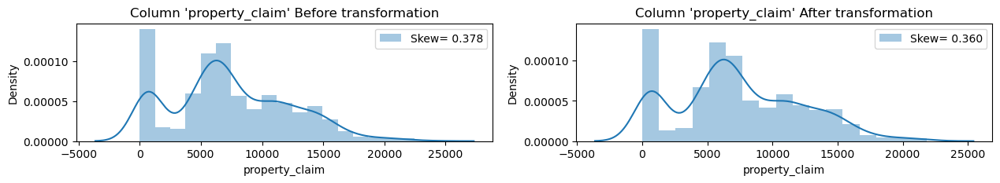

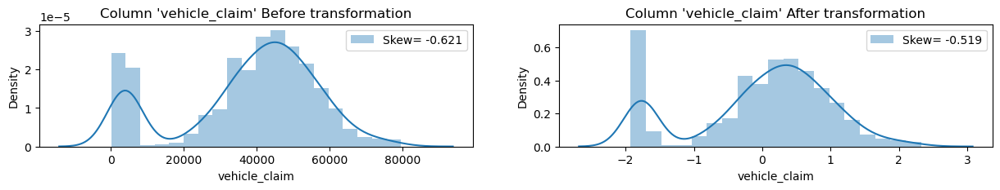

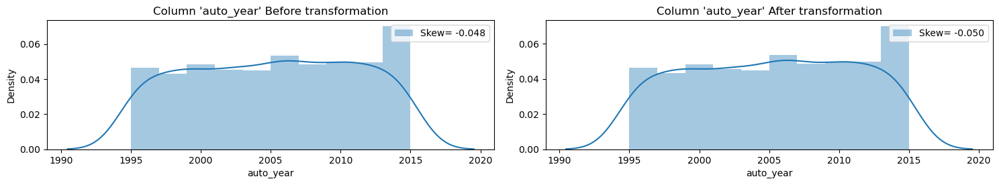

In [64]:
# Distribution plot and skewness
c=1
for i in df2[con]:
    plt.figure(figsize=(15,30))
    
    plt.subplot(13,2,c)
    skew= df[i].skew()
    sns.distplot(df[i], label= 'Skew= %.3f' %skew)
    plt.legend(loc='upper right')
    plt.title("Column '"+i+"' Before transformation")
    
    plt.subplot(13,2,c+1)
    skew= df2[i].skew()
    sns.distplot(df2[i], label= 'Skew= %.3f' %skew)
    plt.legend(loc='upper right')
    plt.title("Column '"+i+"' After transformation")
    
    c+=2
    
plt.tight_layout()

#### Collinearity and multicollinearity

In [65]:
df2.corr()

,months_as_customer,age,policy_annual_premium,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
months_as_customer,1.000000,0.922092,-0.003318,0.007940,0.020379,0.013802,-0.010936,0.063811,0.064814,0.066612,0.041345,0.062501,0.001017
age,0.922092,1.000000,0.005931,-0.006129,0.007904,0.021277,-0.017341,0.056859,0.070692,0.075626,0.064375,0.062241,0.003092
policy_annual_premium,-0.003318,0.005931,1.000000,-0.010529,0.031106,-0.045171,0.024883,0.005857,0.002604,-0.024420,-0.008353,0.012740,-0.039869
capital-gains,0.007940,-0.006129,-0.010529,1.000000,-0.043777,0.059918,0.051280,-0.020595,0.013445,0.025454,-0.006021,0.013923,0.034776
capital-loss,0.020379,0.007904,0.031106,-0.043777,1.000000,-0.009819,-0.024247,-0.037687,-0.032129,-0.039100,-0.020897,-0.029232,-0.061848
number_of_vehicles_involved,0.013802,0.021277,-0.045171,0.059918,-0.009819,1.000000,0.013106,-0.013463,0.267895,0.223815,0.220648,0.261445,0.034336
bodily_injuries,-0.010936,-0.017341,0.024883,0.051280,-0.024247,0.013106,1.000000,-0.005132,0.046051,0.047593,0.034126,0.042871,-0.016399
witnesses,0.063811,0.056859,0.005857,-0.020595,-0.037687,-0.013463,-0.005132,1.000000,-0.013367,-0.027163,0.048736,-0.024658,0.048423
total_claim_amount,0.064814,0.070692,0.002604,0.013445,-0.032129,0.267895,0.046051,-0.013367,1.000000,0.806264,0.813130,0.981250,-0.032982
injury_claim,0.066612,0.075626,-0.024420,0.025454,-0.039100,0.223815,0.047593,-0.027163,0.806264,1.000000,0.565820,0.720048,-0.011540


<AxesSubplot: >

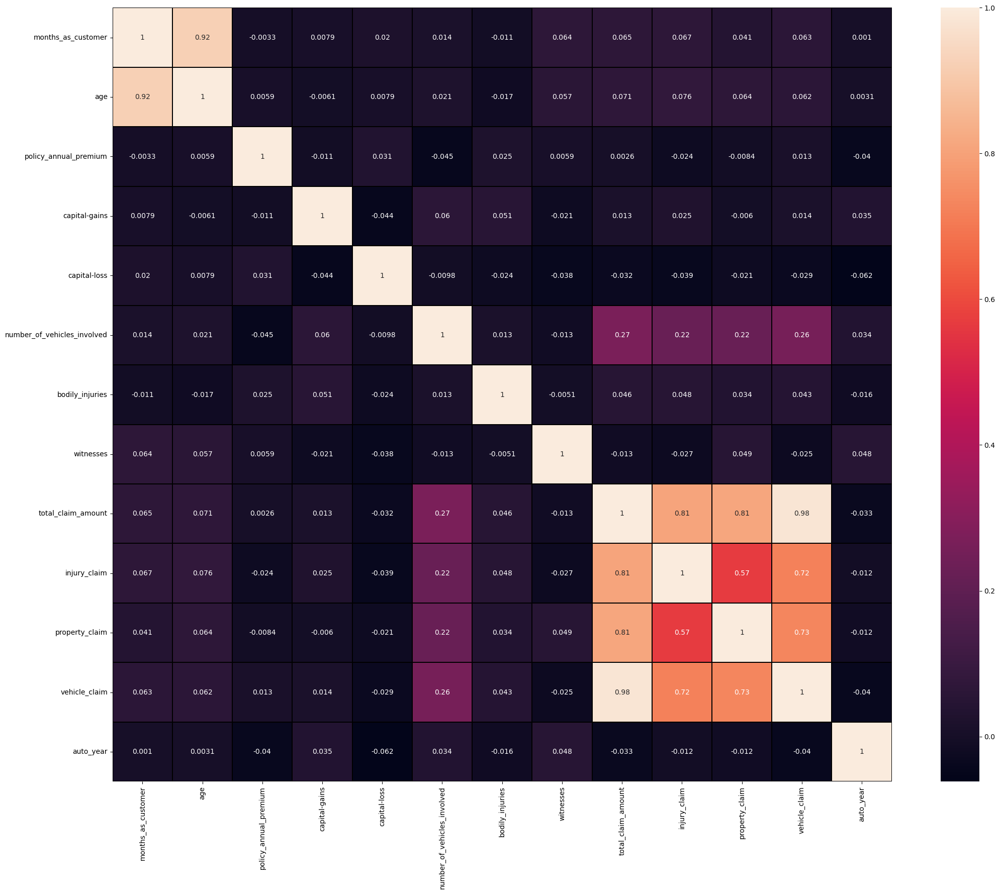

In [66]:
plt.figure(figsize=(25,20))
sns.heatmap(df2.corr(), annot=True, linewidth=0.2, linecolor='black')

Claim amounts are highly correlated with each other.

#### Encoding

In [67]:
con=df2.select_dtypes(include= 'number').columns
con

Index(['months_as_customer', 'age', 'policy_annual_premium', 'capital-gains',
       'capital-loss', 'number_of_vehicles_involved', 'bodily_injuries',
       'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim',
       'vehicle_claim', 'auto_year'],
      dtype='object')

In [68]:
cat

Index(['policy_state', 'policy_csl', 'policy_deductable', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'property_damage', 'police_report_available',
       'auto_make', 'fraud_reported'],
      dtype='object')

In [69]:
for i in cat:
    print(i)
    print(df[i].unique())
    print()

policy_state
['OH' 'IN' 'IL']

policy_csl
['250/500' '100/300' '500/1000']

policy_deductable
[1000 2000 500]

insured_sex
['MALE' 'FEMALE']

insured_education_level
['MD' 'PhD' 'Associate' 'Masters' 'High School' 'College' 'JD']

insured_occupation
['craft-repair' 'machine-op-inspct' 'sales' 'armed-forces' 'tech-support'
 'prof-specialty' 'other-service' 'priv-house-serv' 'exec-managerial'
 'protective-serv' 'transport-moving' 'handlers-cleaners' 'adm-clerical'
 'farming-fishing']

insured_hobbies
['sleeping' 'reading' 'board-games' 'bungie-jumping' 'base-jumping' 'golf'
 'camping' 'dancing' 'skydiving' 'movies' 'hiking' 'yachting' 'paintball'
 'chess' 'kayaking' 'polo' 'basketball' 'video-games' 'cross-fit'
 'exercise']

insured_relationship
['husband' 'other-relative' 'own-child' 'unmarried' 'wife' 'not-in-family']

incident_type
['Single Vehicle Collision' 'Vehicle Theft' 'Multi-vehicle Collision'
 'Parked Car']

collision_type
['Side Collision' '?' 'Rear Collision' 'Front Collisio

In [70]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

n=['insured_education_level', 'insured_relationship', 'incident_state', 'insured_occupation', 'insured_hobbies', 
   'auto_make', target]

for i in n:
    print("Encoding",i)
    df2[i]= le.fit_transform(df2[i])
    
print("Done")

Encoding insured_education_level
Encoding insured_relationship
Encoding incident_state
Encoding insured_occupation
Encoding insured_hobbies
Encoding auto_make
Encoding fraud_reported
Done


In [71]:
du=[]
for i in cat:
    if i not in n:
        du.append(i)
du

['policy_state',
 'policy_csl',
 'policy_deductable',
 'insured_sex',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_city',
 'property_damage',
 'police_report_available']

In [72]:
x= pd.get_dummies(data = df2, columns = du)
x.shape

(995, 61)

In [73]:
df2[x.columns]= x

In [74]:
df2.shape

(995, 72)

In [75]:
#drop columns after encoding
df2=df2.drop(du, axis=1)

In [76]:
df2.shape

(995, 61)

In [77]:
df2.head()

,months_as_customer,age,policy_annual_premium,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_state,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,policy_deductable_500,policy_deductable_1000,policy_deductable_2000,insured_sex_FEMALE,insured_sex_MALE,incident_type_Multi-vehicle Collision,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_?,collision_type_Front Collision,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Major Damage,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Ambulance,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,incident_city_Arlington,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_?,property_damage_NO,property_damage_YES,police_report_available_?,police_report_available_NO,police_report_available_YES
0,328,48,1406.91,4,2,17,0,53300,0,4,1,1,2,0.715714,6510,13020,0.753697,10,2004,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
1,228,42,1197.22,4,6,15,2,0,0,5,1,0,0,-1.776979,780,780,-1.786629,8,2007,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0
2,134,29,1413.14,6,11,2,3,35100,0,1,3,2,3,-0.716825,7700,3850,-0.820881,4,2007,0,0,0,1,1,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0
3,256,41,1415.74,6,1,2,4,48900,-62400,2,1,1,2,0.391426,6340,6340,0.677602,3,2014,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0
4,228,44,1583.91,0,11,2,4,66000,-46000,1,1,0,1,-1.729802,1300,650,-1.740038,0,2009,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0


In [78]:
#check if any object datatype present in the dataset
print(df2.select_dtypes(exclude= 'number').columns)

Index([], dtype='object')


#### Splitting data into features and target variables

In [79]:
x= df2.drop(target, axis=1)
y=df2[target]

print(x.shape, y.shape)

(995, 60) (995,)


Variance Inflation Factor

In [80]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [81]:
def vif_(x1):
    vif= pd.DataFrame()
    vif['Features']= x1.columns
    vif['VIF']= [variance_inflation_factor(x1.values, i) for i in range(x1.shape[1])]
    print(vif)

In [82]:
vif_(x)

                                  Features           VIF
0                       months_as_customer  6.994236e+00
1                                      age  6.967209e+00
2                    policy_annual_premium  1.044242e+00
3                  insured_education_level  1.038605e+00
4                       insured_occupation  1.034894e+00
5                          insured_hobbies  1.069485e+00
6                     insured_relationship  1.062001e+00
7                            capital-gains  1.048672e+00
8                             capital-loss  1.064570e+00
9                           incident_state  1.062760e+00
10             number_of_vehicles_involved  1.771832e+01
11                         bodily_injuries  1.038131e+00
12                               witnesses  1.059526e+00
13                      total_claim_amount  8.876513e+04
14                            injury_claim  3.286426e+03
15                          property_claim  3.187732e+03
16                           ve

We got 'total_claim_amount', 'injury_claim', 'property_claim' and 'number_of_vehicles_involved' with high VIF score. we need to delete highest ViF first and then check the VIF. We need to repeat the process till VIF of all columns are within range.

In [83]:
# dropping column 'total_claim_amount'
x= x.drop('total_claim_amount',axis=1)
vif_(x)

                                  Features        VIF
0                       months_as_customer   6.985871
1                                      age   6.964125
2                    policy_annual_premium   1.043798
3                  insured_education_level   1.038469
4                       insured_occupation   1.033135
5                          insured_hobbies   1.069421
6                     insured_relationship   1.061951
7                            capital-gains   1.048668
8                             capital-loss   1.064247
9                           incident_state   1.057058
10             number_of_vehicles_involved  17.689681
11                         bodily_injuries   1.037958
12                               witnesses   1.059086
13                            injury_claim   2.199014
14                          property_claim   2.295276
15                           vehicle_claim   4.869602
16                               auto_make   1.051304
17                          

In [84]:
# dropping column 'number_of_vehicles_involved'
x= x.drop('number_of_vehicles_involved',axis=1)
vif_(x)

                                  Features       VIF
0                       months_as_customer  6.952806
1                                      age  6.936554
2                    policy_annual_premium  1.043795
3                  insured_education_level  1.038329
4                       insured_occupation  1.033057
5                          insured_hobbies  1.067214
6                     insured_relationship  1.061568
7                            capital-gains  1.043056
8                             capital-loss  1.064244
9                           incident_state  1.057056
10                         bodily_injuries  1.035196
11                               witnesses  1.057671
12                            injury_claim  2.198713
13                          property_claim  2.295168
14                           vehicle_claim  4.869557
15                               auto_make  1.051302
16                               auto_year  1.053960
17                         policy_state_IL    

VIF is now in the range for every column

#### Oversampling using SMOTE

In [85]:
y.value_counts()

0    749
1    246
Name: fraud_reported, dtype: int64

In [86]:
from imblearn.over_sampling import SMOTE

In [87]:
sm = SMOTE()
x, y = sm.fit_resample(x, y)

In [88]:
x.shape, y.shape

((1498, 58), (1498,))

In [89]:
y.value_counts()

1    749
0    749
Name: fraud_reported, dtype: int64

#### Scaling

In [90]:
con

Index(['months_as_customer', 'age', 'policy_annual_premium', 'capital-gains',
       'capital-loss', 'number_of_vehicles_involved', 'bodily_injuries',
       'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim',
       'vehicle_claim', 'auto_year'],
      dtype='object')

In [91]:
sc=['months_as_customer', 'age', 'policy_annual_premium', 'capital-gains','capital-loss', 
    'bodily_injuries', 'witnesses', 'injury_claim', 'property_claim','vehicle_claim',
    'auto_year']

In [92]:
for i in x:
    if i in cat:
        sc.append(i)

In [93]:

from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
x[sc] = scaler.fit_transform(x[sc])

In [94]:
x

,months_as_customer,age,policy_annual_premium,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_state,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,policy_deductable_500,policy_deductable_1000,policy_deductable_2000,insured_sex_FEMALE,insured_sex_MALE,incident_type_Multi-vehicle Collision,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_?,collision_type_Front Collision,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Major Damage,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Ambulance,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,incident_city_Arlington,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_?,property_damage_NO,property_damage_YES,police_report_available_?,police_report_available_NO,police_report_available_YES
0,1.126202,1.053064,0.675108,0.646583,-1.200722,1.397978,-1.410114,1.011417,0.961016,0.454060,0.151361,0.572713,-0.251129,1.121469,0.701046,0.968094,-0.178723,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
1,0.213568,0.365305,-0.240135,0.646583,-0.145777,1.029383,-0.142957,-0.899415,0.961016,0.944105,-1.115337,-1.344437,-1.499813,-1.532418,-2.105188,0.437757,0.348299,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0
2,-0.644309,-1.124840,0.702301,1.729401,1.172905,-1.366482,0.490622,0.358938,0.961016,-1.016075,1.418059,1.531288,0.008196,-0.866778,-1.038351,-0.622915,0.348299,0,0,1,1,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0
3,0.469105,0.250679,0.713649,1.729401,-1.464459,-1.366482,1.124200,0.853675,-1.281833,-0.526030,0.151361,0.572713,-0.288176,-0.326894,0.616986,-0.888083,1.578019,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0
4,0.213568,0.594558,1.447669,-1.519053,1.172905,-1.366482,1.124200,1.466718,-0.692366,-1.016075,-1.115337,-0.385862,-1.386495,-1.560604,-2.053720,-1.683587,0.699648,1,0,0,0,0,1,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,0.031041,0.136052,0.554310,-1.519053,1.436641,-0.997888,-0.776536,-0.899415,0.961016,-0.526030,-1.115337,0.572713,0.966828,-0.461106,-0.339555,-0.357747,1.050996,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1494,2.057090,2.313956,-0.679464,-1.519053,0.117960,-0.629293,-0.142957,1.700715,-0.625943,0.944105,0.151361,-0.385862,-0.583240,0.460816,0.234531,0.172589,-0.003049,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1495,0.615127,0.594558,-0.928696,0.646583,0.381696,-0.629293,-0.776536,1.491957,0.961016,-1.016075,0.151361,0.572713,-1.195596,-1.126529,-1.228565,-0.092579,-0.003049,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1496,0.706390,0.365305,0.524842,-0.436235,-0.409513,-0.076401,-0.142957,-0.899415,0.961016,-0.035985,0.151361,-0.385862,-1.610081,-1.642129,-1.168087,-0.622915,-1.232769,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


#### Model

In [154]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [155]:
mdl, acc, rs, tr, cvsc= [],[],[],[],[]

# function to get best random_state
def prediction(model, ran):
    acctr=0
    acct=0
    r=0
    
    for i in range (ran):
        x_train, x_test, y_train, y_test= train_test_split(x,y, test_size=0.25, random_state=i, stratify =y)
            
        model.fit(x_train, y_train)     #train model
        y_tr= model.predict(x_train)    #prediction on train
        y_pred=model.predict(x_test)    #prediction on test
        
        pred_tr= accuracy_score(y_train, y_tr)    #R2 score of train
        pred_test= accuracy_score(y_test,y_pred)       #R2 score of test
    
    #sort randomstate at which train and test score difference is 1.
        margin=np.abs(round(pred_tr*100)-round(pred_test*100))
        
        if pred_test>acct or pred_tr>acctr:
            if ((margin<=1) and (round(pred_test*100)>=75)):   
                print("at random state", i)
                print("Accuracy of train is ",pred_tr*100)
                print("Accuracy of test is ",pred_test*100)
                print("-x"*20)
                print()
                
                #if pred_tr>acctr:
                acctr= pred_tr
                    
                #elif pred_test>acct:
                acct= pred_test
    
    print("Best Random_states sorted.")

    
# function to get score at the best random_state
def final(model, best_rs):
    x_train, x_test, y_train, y_test= train_test_split(x,y, test_size=0.25, random_state=best_rs, stratify =y)
    
    model.fit(x_train, y_train)     #train model
    y_tr= model.predict(x_train)    #prediction on train
    y_pred=model.predict(x_test)    #prediction on test
    
    pred_tr= accuracy_score(y_train, y_tr)    # score of train
    pred_test= accuracy_score(y_test,y_pred)       #score of test
    
    print("at random state", best_rs)
    print("Accuracy of train is ",pred_tr*100)
    print("Accuracy of test is ",pred_test*100)
    print()
    print('Confusion Matrix')
    print(confusion_matrix(y_test, y_pred))
    print()
    print('Classification Report')
    print(classification_report(y_test, y_pred))
          
    #saving the data
    tr.append(pred_tr)
    acc.append(pred_test)
    rs.append(best_rs)
    


def cv_score(model, x, y):    # cross val score of the model
    cvsco=0
    for val in range(2,21):
        cv = cross_val_score(model, x, y, cv = val).mean()
        print('cross_val_score', cv*100,'at cv =', val)
        if cvsco<cv*100:
            cvsco=cv*100
    cvsc.append(cvsco)        
    
        

#### LogisticRegression

In [156]:
lr= LogisticRegression()
prediction(lr, 200)

at random state 2
Accuracy of train is  88.42386464826359
Accuracy of test is  86.66666666666667
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 4
Accuracy of train is  87.62243989314337
Accuracy of test is  87.2
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 5
Accuracy of train is  87.88958147818343
Accuracy of test is  87.73333333333333
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 22
Accuracy of train is  87.35529830810329
Accuracy of test is  88.26666666666667
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 32
Accuracy of train is  88.15672306322351
Accuracy of test is  86.66666666666667
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 33
Accuracy of train is  87.80053428317008
Accuracy of test is  87.46666666666667
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 40
Accuracy of train is  88.33481745325022
Accuracy of test is  86.93333333333332
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 54
Accuracy of train

Best accuracy is at random_state 154

In [157]:
#final metrics
final(lr,154)
mdl.append("LogisticRegression")

at random state 154
Accuracy of train is  88.33481745325022
Accuracy of test is  88.26666666666667

Confusion Matrix
[[167  20]
 [ 24 164]]

Classification Report
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       187
           1       0.89      0.87      0.88       188

    accuracy                           0.88       375
   macro avg       0.88      0.88      0.88       375
weighted avg       0.88      0.88      0.88       375



In [158]:
cv_score(lr,x,y)

cross_val_score 80.04005340453939 at cv = 2
cross_val_score 78.92398129592519 at cv = 3
cross_val_score 82.12495543672014 at cv = 4
cross_val_score 82.52575250836121 at cv = 5
cross_val_score 82.32637215528781 at cv = 6
cross_val_score 83.71161548731642 at cv = 7
cross_val_score 84.07562009329843 at cv = 8
cross_val_score 83.41309349173139 at cv = 9
cross_val_score 83.85950782997762 at cv = 10
cross_val_score 84.7378898473789 at cv = 11
cross_val_score 84.52580645161291 at cv = 12
cross_val_score 84.68573405604889 at cv = 13
cross_val_score 84.913217623498 at cv = 14
cross_val_score 85.45791245791247 at cv = 15
cross_val_score 85.21791352093344 at cv = 16
cross_val_score 85.13714474553866 at cv = 17
cross_val_score 85.29594568751196 at cv = 18
cross_val_score 85.33114675686295 at cv = 19
cross_val_score 84.92342342342344 at cv = 20


#### DecisionTreeClassifier

In [159]:
dt=DecisionTreeClassifier()
prediction(dt,200)

Best Random_states sorted.


DecisionTree is not feasible.
In such case we will go with any random state and check the metrics.

In [160]:
#final metrics
final(dt,154)
mdl.append("DecisionTreeClassifier")

at random state 154
Accuracy of train is  100.0
Accuracy of test is  86.93333333333332

Confusion Matrix
[[162  25]
 [ 24 164]]

Classification Report
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       187
           1       0.87      0.87      0.87       188

    accuracy                           0.87       375
   macro avg       0.87      0.87      0.87       375
weighted avg       0.87      0.87      0.87       375



In [161]:
cv_score(dt,x,y)

cross_val_score 75.76769025367156 at cv = 2
cross_val_score 81.11556446225784 at cv = 3
cross_val_score 82.450623885918 at cv = 4
cross_val_score 83.51995540691193 at cv = 5
cross_val_score 83.45274431057564 at cv = 6
cross_val_score 83.5781041388518 at cv = 7
cross_val_score 82.99792354078961 at cv = 8
cross_val_score 83.06719893546241 at cv = 9
cross_val_score 84.51991051454138 at cv = 10
cross_val_score 83.13019633865491 at cv = 11
cross_val_score 83.85322580645163 at cv = 12
cross_val_score 84.06873486333757 at cv = 13
cross_val_score 83.5781041388518 at cv = 14
cross_val_score 83.98653198653199 at cv = 15
cross_val_score 83.92959277053306 at cv = 16
cross_val_score 84.79015201586253 at cv = 17
cross_val_score 83.9437113533499 at cv = 18
cross_val_score 84.25750354464545 at cv = 19
cross_val_score 83.98468468468468 at cv = 20


#### RandomForestClassifier

In [162]:
rf=RandomForestClassifier()
prediction(rf,100)

Best Random_states sorted.


RandomForest is also not feasible

In [163]:
#final metrics
final(rf,154)
mdl.append("RandomForestClassifier")

at random state 154
Accuracy of train is  100.0
Accuracy of test is  88.8

Confusion Matrix
[[165  22]
 [ 20 168]]

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       187
           1       0.88      0.89      0.89       188

    accuracy                           0.89       375
   macro avg       0.89      0.89      0.89       375
weighted avg       0.89      0.89      0.89       375



In [164]:
cv_score(rf,x,y)

cross_val_score 82.37650200267022 at cv = 2
cross_val_score 80.59024716098865 at cv = 3
cross_val_score 84.85757575757576 at cv = 4
cross_val_score 85.5921962095875 at cv = 5
cross_val_score 85.1255689424364 at cv = 6
cross_val_score 85.84779706275033 at cv = 7
cross_val_score 86.66941631584936 at cv = 8
cross_val_score 86.54017266671477 at cv = 9
cross_val_score 86.32527964205818 at cv = 10
cross_val_score 86.9998828994106 at cv = 11
cross_val_score 86.65967741935484 at cv = 12
cross_val_score 86.27724599238842 at cv = 13
cross_val_score 86.51535380507342 at cv = 14
cross_val_score 87.19124579124579 at cv = 15
cross_val_score 86.5462708762297 at cv = 16
cross_val_score 86.26599771675781 at cv = 17
cross_val_score 86.62029068655573 at cv = 18
cross_val_score 87.53224346162388 at cv = 19
cross_val_score 86.52342342342344 at cv = 20


#### SVC

In [165]:
svc = SVC()
prediction(svc,100)

Best Random_states sorted.


In [166]:
#final metrics on any random_state
final(svc,154)
mdl.append("SVC")

at random state 154
Accuracy of train is  94.65716829919857
Accuracy of test is  87.46666666666667

Confusion Matrix
[[173  14]
 [ 33 155]]

Classification Report
              precision    recall  f1-score   support

           0       0.84      0.93      0.88       187
           1       0.92      0.82      0.87       188

    accuracy                           0.87       375
   macro avg       0.88      0.87      0.87       375
weighted avg       0.88      0.87      0.87       375



In [167]:
cv_score(svc,x,y)

cross_val_score 80.24032042723633 at cv = 2
cross_val_score 79.05744822979291 at cv = 3
cross_val_score 81.19144385026738 at cv = 4
cross_val_score 80.52575250836121 at cv = 5
cross_val_score 80.32663989290495 at cv = 6
cross_val_score 81.5754339118825 at cv = 7
cross_val_score 81.74458129480031 at cv = 8
cross_val_score 81.41628389806732 at cv = 9
cross_val_score 82.05995525727069 at cv = 10
cross_val_score 82.87403879932863 at cv = 11
cross_val_score 82.65967741935484 at cv = 12
cross_val_score 82.82089724368583 at cv = 13
cross_val_score 83.5781041388518 at cv = 14
cross_val_score 83.7919191919192 at cv = 15
cross_val_score 83.68937314115763 at cv = 16
cross_val_score 83.93844258847564 at cv = 17
cross_val_score 84.0975011155734 at cv = 18
cross_val_score 83.79968909615812 at cv = 19
cross_val_score 83.92522522522523 at cv = 20


#### KNeighborsClassifier

In [168]:
knn= KNeighborsClassifier()
prediction(knn,200)

Best Random_states sorted.


In [169]:
#final metrics on any random_state
final(knn,154)
mdl.append("KNeighborsClassifier")

at random state 154
Accuracy of train is  73.0186999109528
Accuracy of test is  66.13333333333333

Confusion Matrix
[[ 64 123]
 [  4 184]]

Classification Report
              precision    recall  f1-score   support

           0       0.94      0.34      0.50       187
           1       0.60      0.98      0.74       188

    accuracy                           0.66       375
   macro avg       0.77      0.66      0.62       375
weighted avg       0.77      0.66      0.62       375



In [170]:
cv_score(knn,x,y)

cross_val_score 65.7543391188251 at cv = 2
cross_val_score 66.82498329993321 at cv = 3
cross_val_score 66.49126559714796 at cv = 4
cross_val_score 67.29297658862878 at cv = 5
cross_val_score 66.55930388219545 at cv = 6
cross_val_score 66.48865153538051 at cv = 7
cross_val_score 65.82126806235067 at cv = 8
cross_val_score 66.75845096954684 at cv = 9
cross_val_score 66.5565995525727 at cv = 10
cross_val_score 66.75611850579648 at cv = 11
cross_val_score 66.35698924731182 at cv = 12
cross_val_score 66.62034367431667 at cv = 13
cross_val_score 66.55540720961281 at cv = 14
cross_val_score 67.02491582491582 at cv = 15
cross_val_score 66.63020475863647 at cv = 16
cross_val_score 66.42432253800396 at cv = 17
cross_val_score 66.55271881175496 at cv = 18
cross_val_score 66.42323920804932 at cv = 19
cross_val_score 66.4882882882883 at cv = 20


#### GaussianNB

In [171]:
gnb= GaussianNB()
prediction(gnb,200)

at random state 3
Accuracy of train is  86.99910952804987
Accuracy of test is  86.66666666666667
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 4
Accuracy of train is  85.75244879786287
Accuracy of test is  87.2
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 6
Accuracy of train is  86.64292074799644
Accuracy of test is  85.86666666666667
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 10
Accuracy of train is  85.93054318788958
Accuracy of test is  87.46666666666667
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 16
Accuracy of train is  86.37577916295636
Accuracy of test is  86.4
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 20
Accuracy of train is  86.82101513802316
Accuracy of test is  87.2
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 21
Accuracy of train is  86.99910952804987
Accuracy of test is  86.13333333333333
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 22
Accuracy of train is  85.93054318788958
Acc

Best accuracy is at random_state 47

In [172]:
final(gnb,47)
mdl.append("GaussianNB")

at random state 47
Accuracy of train is  87.26625111308994
Accuracy of test is  86.93333333333332

Confusion Matrix
[[162  25]
 [ 24 164]]

Classification Report
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       187
           1       0.87      0.87      0.87       188

    accuracy                           0.87       375
   macro avg       0.87      0.87      0.87       375
weighted avg       0.87      0.87      0.87       375



In [173]:
cv_score(gnb,x,y)

cross_val_score 72.29639519359145 at cv = 2
cross_val_score 73.37755511022044 at cv = 3
cross_val_score 79.249376114082 at cv = 4
cross_val_score 81.52084726867335 at cv = 5
cross_val_score 81.32315930388219 at cv = 6
cross_val_score 83.51134846461949 at cv = 7
cross_val_score 84.66620207077028 at cv = 8
cross_val_score 84.80067976496805 at cv = 9
cross_val_score 85.25637583892617 at cv = 10
cross_val_score 85.39658066278935 at cv = 11
cross_val_score 85.58978494623656 at cv = 12
cross_val_score 85.73982239649408 at cv = 13
cross_val_score 85.38050734312415 at cv = 14
cross_val_score 85.78855218855217 at cv = 15
cross_val_score 85.60970029741478 at cv = 16
cross_val_score 85.79958541128403 at cv = 17
cross_val_score 85.94855612927901 at cv = 18
cross_val_score 85.79408599395275 at cv = 19
cross_val_score 85.92072072072072 at cv = 20


#### AdaBoostClassifier

In [174]:
adb= AdaBoostClassifier()
prediction(adb,500)

at random state 0
Accuracy of train is  89.13624220837043
Accuracy of test is  87.73333333333333
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 2
Accuracy of train is  89.49243098842386
Accuracy of test is  88.53333333333333
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 33
Accuracy of train is  90.11576135351737
Accuracy of test is  89.06666666666668
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 38
Accuracy of train is  89.40338379341051
Accuracy of test is  89.60000000000001
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 49
Accuracy of train is  89.93766696349064
Accuracy of test is  89.33333333333333
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 57
Accuracy of train is  90.38290293855744
Accuracy of test is  88.53333333333333
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 77
Accuracy of train is  90.026714158504
Accuracy of test is  88.8
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x

at random state 89
Accuracy of train 

Best random_state is at 312.

In [175]:
#final metrics
final(adb,312)
mdl.append("AdaBoost")

at random state 312
Accuracy of train is  89.93766696349064
Accuracy of test is  89.86666666666666

Confusion Matrix
[[171  17]
 [ 21 166]]

Classification Report
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       188
           1       0.91      0.89      0.90       187

    accuracy                           0.90       375
   macro avg       0.90      0.90      0.90       375
weighted avg       0.90      0.90      0.90       375



In [176]:
cv_score(adb,x,y)

cross_val_score 79.17222963951936 at cv = 2
cross_val_score 78.92398129592519 at cv = 3
cross_val_score 83.59108734402852 at cv = 4
cross_val_score 83.52508361204013 at cv = 5
cross_val_score 83.66050870147255 at cv = 6
cross_val_score 85.04672897196261 at cv = 7
cross_val_score 84.27295482990101 at cv = 8
cross_val_score 84.34215905538322 at cv = 9
cross_val_score 85.79194630872482 at cv = 10
cross_val_score 85.4034115305047 at cv = 11
cross_val_score 85.9252688172043 at cv = 12
cross_val_score 85.08418867489334 at cv = 13
cross_val_score 85.38050734312415 at cv = 14
cross_val_score 85.79191919191919 at cv = 15
cross_val_score 85.21719858156028 at cv = 16
cross_val_score 85.80258967734183 at cv = 17
cross_val_score 85.3573022247721 at cv = 18
cross_val_score 85.06722014383573 at cv = 19
cross_val_score 85.92522522522522 at cv = 20


#### Model Summary

In [177]:
pd.DataFrame({"Model name": mdl, "Random_state":rs, "Train_Accuracy": tr, "Test_Accuracy": acc, "CV_score": cvsc})

,Model name,Random_state,Train_Accuracy,Test_Accuracy,CV_score
0,LogisticRegression,154,0.883348,0.882667,85.457912
1,DecisionTreeClassifier,154,1.000000,0.869333,84.790152
2,RandomForestClassifier,154,1.000000,0.888000,87.532243
3,SVC,154,0.946572,0.874667,84.097501
4,KNeighborsClassifier,154,0.730187,0.661333,67.292977
5,GaussianNB,47,0.872663,0.869333,85.948556
6,AdaBoost,312,0.899377,0.898667,85.925269


From the above data, we can see that LogisticRegression have better metrics.

#### Hyperparameter Tunning

In [220]:
y_test1=[]
y_pred1=[]
def tuned (model, rs):
    x_train, x_test, y_train, y_test= train_test_split(x,y, test_size=0.25, random_state=rs, stratify=y)
    
    model.fit(x_train, y_train)     #train model
    y_tr= model.predict(x_train)    #prediction on train
    y_pred=model.predict(x_test)    #prediction on test

    pred_tr= accuracy_score(y_train, y_tr)    #score of train
    pred_test= accuracy_score(y_test,y_pred)       #score of test

    print("Accuracy of train is ",pred_tr*100)
    print("Accuracy of test is ",pred_test*100)
    print()
    print('Confusion Matrix')
    print(confusion_matrix(y_test, y_pred))
    print()
    print('Classification Report')
    print(classification_report(y_test, y_pred))

#### Hypertuning LogisticRegresor

In [191]:
lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [192]:
param = {'penalty' : ['l1', 'l2', 'elasticnet', 'none'], 
             'solver' : ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
            'multi_class' : ['auto', 'ovr', 'multinomial'],
             'tol': [.0001, .0002, .0003, .0004]}

grid = GridSearchCV(lr, param_grid=param)
grid.fit(x, y)

GridSearchCV(estimator=LogisticRegression(),
             param_grid={'multi_class': ['auto', 'ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga'],
                         'tol': [0.0001, 0.0002, 0.0003, 0.0004]})

In [193]:
# getting best parameters
grid.best_params_

{'multi_class': 'auto', 'penalty': 'l2', 'solver': 'liblinear', 'tol': 0.0001}

In [194]:
lrht=LogisticRegression(multi_class='auto',  penalty = 'l2', solver = 'liblinear',tol= 0.0001, n_jobs=-1)

In [212]:
tuned(lrht, 154)

Accuracy of train is  87.80053428317008
Accuracy of test is  88.26666666666667

Confusion Matrix
[[166  21]
 [ 23 165]]

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.89      0.88       187
           1       0.89      0.88      0.88       188

    accuracy                           0.88       375
   macro avg       0.88      0.88      0.88       375
weighted avg       0.88      0.88      0.88       375



After Hyper_tunning, the accuracy is reduced.

we will stick with LogisticRegression before tunning.

#### Hypertuning AdaBoost

In [213]:
adb.get_params()

{'algorithm': 'SAMME.R',
 'base_estimator': 'deprecated',
 'estimator': None,
 'learning_rate': 1.0,
 'n_estimators': 50,
 'random_state': None}

In [214]:
param = {'base_estimator' : [LogisticRegression(), DecisionTreeClassifier(), RandomForestClassifier(),
                            KNeighborsClassifier(), GaussianNB()], 
             'n_estimators' : [50,100], 
            'algorithm' : ['SAMME.R', 'SAMME'],}

In [215]:
grid = GridSearchCV(adb, param_grid=param)
grid.fit(x, y)

GridSearchCV(estimator=AdaBoostClassifier(),
             param_grid={'algorithm': ['SAMME.R', 'SAMME'],
                         'base_estimator': [LogisticRegression(),
                                            DecisionTreeClassifier(),
                                            RandomForestClassifier(),
                                            KNeighborsClassifier(),
                                            GaussianNB()],
                         'n_estimators': [50, 100]})

In [216]:
# getting best parameters
grid.best_params_

{'algorithm': 'SAMME',
 'base_estimator': RandomForestClassifier(),
 'n_estimators': 50}

In [217]:
#adaboost hyper tuned
adbht=AdaBoostClassifier(algorithm= 'SAMME', base_estimator = RandomForestClassifier(), n_estimators= 50)

In [219]:
tuned(adbht, 312)

Accuracy of train is  100.0
Accuracy of test is  88.0

Confusion Matrix
[[166  22]
 [ 23 164]]

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       188
           1       0.88      0.88      0.88       187

    accuracy                           0.88       375
   macro avg       0.88      0.88      0.88       375
weighted avg       0.88      0.88      0.88       375



After Hyper_tunning, the model became overfitted for train dataset.

we will stick with LogisticRegression before tunning.

In [224]:
#LR without tuning
model= lr
x_train, x_test, y_train, y_test= train_test_split(x,y, test_size=0.25, random_state=154, stratify=y)
    
model.fit(x_train, y_train)     #train model
y_tr= model.predict(x_train)    #prediction on train
y_pred=model.predict(x_test)    #prediction on test

pred_tr= accuracy_score(y_train, y_tr)    #score of train
pred_test= accuracy_score(y_test,y_pred)       #score of test

print("Accuracy of train is ",pred_tr*100)
print("Accuracy of test is ",pred_test*100)
print()
print('Confusion Matrix')
print(confusion_matrix(y_test, y_pred))
print()
print('Classification Report')
print(classification_report(y_test, y_pred))

Accuracy of train is  88.33481745325022
Accuracy of test is  88.26666666666667

Confusion Matrix
[[167  20]
 [ 24 164]]

Classification Report
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       187
           1       0.89      0.87      0.88       188

    accuracy                           0.88       375
   macro avg       0.88      0.88      0.88       375
weighted avg       0.88      0.88      0.88       375



#### AUC-ROC Curve

In [225]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

In [227]:
fpr, tpr, threshold = roc_curve(y_test, y_pred)

print("Threshold", threshold)
print("FPR", fpr)
print("TPR", tpr)

Threshold [2 1 0]
FPR [0.         0.10695187 1.        ]
TPR [0.         0.87234043 1.        ]


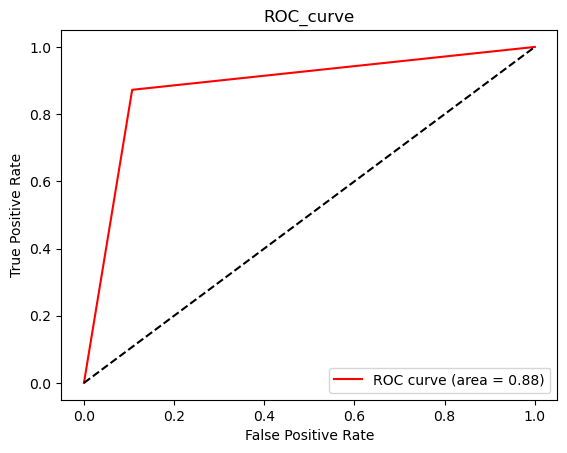

In [228]:
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr,color='Red', label = "ROC curve (area = %0.2f)" % roc_auc)
plt.plot([0,1],[0,1],color="Black", linestyle="--")
plt.title("ROC_curve")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc = "lower right")

plt.show()

#### Saving model

In [229]:
import pickle

#saving model
pickle.dump(lr, open('Fraud.pkl', 'wb'))

In [230]:
#Load model
file= pickle.load(open('Fraud.pkl', 'rb'))

In [231]:
file.predict(x_test)

array([0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0,

#### Conclusion

In [232]:
pd.set_option('display.max_rows', None)

In [233]:
end= pd.DataFrame({"y_test actual": y_test, "Predicted output": y_pred, "Predicted output pickle": file.predict(x_test),
             "Correct Prediction?": y_test==y_pred})
end.shape

(375, 4)

In [234]:
end.sample(50)

,y_test actual,Predicted output,Predicted output pickle,Correct Prediction?
408,0,0,0,True
967,1,1,1,True
850,0,0,0,True
456,0,0,0,True
467,0,0,0,True
1243,1,1,1,True
930,1,0,0,False
934,1,1,1,True
339,0,0,0,True
882,0,0,0,True
